 # <font color = red>Table of Contents </font>
 <br><br>
[Dataset Information](#Dataset_Information) <br>
[Importing the libraries](#Importing_the_Libraries) <br>
[Importing the Dataset](#Importing_the_Dataset) <br>
[Exploratory Data Analyses](#Exploratory_Data_Analyses) <br>
[Model 1: Logistic Regression Model](#Logistic_Regression_Model)<br>

>[Predictions and Evaluations of the Logistic Regression Model](#Evaluation_of_Logistic_Regression_Model) <br>
>[Applying k-Fold Cross Validation on Logistic Regression Model](#kFold_Cross_Validation_on_Logistic_Regression_Model) <br>
>[Grid Search - Logistic Regression Model](#Grid_Search_-_Logistic_Regression_Model) <br>

[Model 2: KNN Classification](#KNN_Classification)<br>

>[Standardize the Variables](#Standardize_the_Variables) <br>
>[Predictions and Evaluations of the KNN Classification Model](#Predictions_and_Evaluations_of_the_KNN Classification_Model) <br>
>[Applying k-Fold Cross Validation to KNN Classification](#Applying_kFold_Cross_Validation_to_KNN_Classification) <br>
>[Choosing a K Value for KNN Classification](#Choosing_a_K_Value_for_KNN_Classification) <br>
>[Retrain with new K Value](#Retrain_with_new_K_Value) <br>
>[Grid Search - KNN Classification](#Grid_Search_KNN_Classification) <br>

[Model 3: Support Vector Machine](#Support_Vector_Machine)<br>

[Model 4: Naive Bayes](#Naive_Bayes)<br>

[Model 5: Decision Tree Classification](#Decision_Tree)<br>

[Model 6: Random_Forest_Classification](#Random_Forest)<br>


[Regression](#Regression)<br>
<br>Kernel SVM
<br>Naive Bayes
<br>Decision Tree Classification
<br>Random Forest Classification
<br>K-Fold Cross Validation
<br>XGBoost
<br>PCA
<br>GridSearch
<br>Conclusion
> [Questions](#Questions) <br>


# Study Aims

<a id='Dataset_Information'></a>
# Dataset Information

1) PCI_Total(Perfectionistic Cognitions Inventory - PCI, Flett, et. al., 1998) - Measures perfectionistic cognitions
Research has linked high PCI scores in studentswith elevated levels of anxiety sensitivity
<br>
2) RosenbergSES_Total (Rosenberg Self-Esteem Scale) - Measures self-esteem
<br>
3) Rumination_Total (Ruminative Responses Scale - Treynor, Gonzalex, and Nolen-Hoeksema, 2003)) - Measure of rumination
<br>
4) PSWQ_Total (Penn State Worry Questionnaire - Meyer, Miller, Metzger, and Borkovec, 1990) - Measure of Worry
<br>
5) DASS21_Total (Depression, Anziety and Stress Scales - DASS-21 - Lovibond and Lovibond, 1995) - Measure of psychological distress
<br>
6) PRCScaleTotal (Procrastination Scale - Lay, 1986) - Measure of procrastination
<br>
7) TargetVariable - Denotes if student is currently 'enrolled' or has 'withdrawn' from the course.


#Define Independent Variables
X = PCI_Total, RosenbergSES_Total, Rumination_Total, PSWQ_Total, DASS21_Total, PRCScaleTotal

#Define Dependent Variable
y = TargetVariable



<a id='Importing_the_Libraries'></a>
# Importing the Libraries

In [6]:
import itertools

import numpy as np
import pandas as pd

%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

#stats model
import statsmodels.api as sm

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

from sklearn import model_selection
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier

from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import average_precision_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

import warnings
warnings.filterwarnings('ignore')


<a id='Importing_the_Dataset'></a>
# Importing the Dataset

In [7]:
df = pd.read_csv('07_WellBeingWithAwardStatusClean_22Mar19.csv')


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 933 entries, 0 to 932
Data columns (total 32 columns):
SONAid                               933 non-null object
Gender                               933 non-null object
Age                                  933 non-null int64
Country                              933 non-null object
AcadStatStudyMode_FullTime           933 non-null object
AcadStatStudyMode_PartTime           933 non-null object
StudyMode1                           933 non-null object
AcadStatStudyMode_Online             933 non-null object
AcadStatStudyMode_OnCampus           933 non-null object
StudyMode2                           933 non-null object
ProcrasProgramOffer                  933 non-null object
StressProgramOffer                   933 non-null object
PCI_Total                            933 non-null int64
RosenbergSES_Total                   933 non-null int64
RosenbergSES_Class                   933 non-null object
Rumination_Total                     933 no

In [9]:
df.head()

,SONAid,Gender,Age,Country,AcadStatStudyMode_FullTime,AcadStatStudyMode_PartTime,StudyMode1,AcadStatStudyMode_Online,AcadStatStudyMode_OnCampus,StudyMode2,...,MSES_R_Total,PSWQ_Total,DASS21_Depression,DASS21_Anxiety,DASS21_Stress,DASS21_Depression_Class,DASS21_Anxiety_Class,DASS21_Stress_Class,PRCScaleTotal,TargetVariable
0,8575,Male,30,,,PartTime,PartTime,,OnCampus,OnCampus,...,61,57,1,1,2,1,1,1,67,Enrolled
1,9727,Male,28,,FullTime,,FullTime,,,,...,71,24,0,1,1,1,1,1,46,Withdrawn
2,8467,Male,21,,FullTime,,FullTime,,,,...,69,28,4,2,3,1,1,1,55,Withdrawn
3,9211,Male,44,,FullTime,,FullTime,,OnCampus,OnCampus,...,64,30,0,0,3,1,1,1,48,Withdrawn
4,9190,Male,22,,FullTime,,FullTime,,,,...,63,33,3,3,11,1,1,3,61,Enrolled


In [10]:

TarVarEnrolled = df.TargetVariable[df.TargetVariable == 'Enrolled'].value_counts()
TarVarEnrolled

Enrolled    568
Name: TargetVariable, dtype: int64

In [11]:
print(list(df.columns))

['SONAid', 'Gender', 'Age', 'Country', 'AcadStatStudyMode_FullTime', 'AcadStatStudyMode_PartTime', 'StudyMode1', 'AcadStatStudyMode_Online', 'AcadStatStudyMode_OnCampus', 'StudyMode2', 'ProcrasProgramOffer', 'StressProgramOffer', 'PCI_Total', 'RosenbergSES_Total', 'RosenbergSES_Class', 'Rumination_Total', 'MSES_R_EmotionRegulation', 'MSES_R_Equanimity', 'MSES_R_SocialSkills', 'MSES_R_DistressTolerance', 'MSES_R_TakingResponsibility', 'MSES_R_InterpersonalEffectiveness', 'MSES_R_Total', 'PSWQ_Total', 'DASS21_Depression', 'DASS21_Anxiety', 'DASS21_Stress', 'DASS21_Depression_Class', 'DASS21_Anxiety_Class', 'DASS21_Stress_Class', 'PRCScaleTotal', 'TargetVariable']


In [30]:
#Feature Engineering

#Create DASS_Total (Combined score for psychological distress)
df['DASS21_Total']=df['DASS21_Depression']+df['DASS21_Anxiety']+df['DASS21_Stress']



# Define Features of Interest In One DataFrame - df_new:
#df_new = df.loc[:,['PCI_Total','RosenbergSES_Total', 'Rumination_Total', 'PSWQ_Total', 'DASS21_Total', 'PRCScaleTotal', 'TargetVariable']]
df_new = df.loc[:,['PCI_Total','RosenbergSES_Total', 'Rumination_Total', 'PSWQ_Total', 'DASS21_Total','PRCScaleTotal', 'TargetVariable']]
df_new.head()




,PCI_Total,RosenbergSES_Total,Rumination_Total,PSWQ_Total,DASS21_Total,PRCScaleTotal,TargetVariable
0,72,29,38,57,4,67,Enrolled
1,15,40,25,24,2,46,Withdrawn
2,36,28,32,28,9,55,Withdrawn
3,65,37,32,30,3,48,Withdrawn
4,56,26,55,33,17,61,Enrolled


In [31]:
#Dictionary for cleaning up the TargetVariable columns:
        
cleanup_TargetVariable = {"TargetVariable": {"Withdrawn": 0, "Enrolled": 1}}
                                                                          
#To convert the variables "TargetVariable"to numbers using replace :

df_new.replace(cleanup_TargetVariable, inplace=True);





In [32]:
# cleanup_RosenbergSES_Class={"RosenbergSES_Class": {"Low Self-Esteem": 0, "Normal Self-Esteem": 1}}
                                                   
# df_new.replace(cleanup_RosenbergSES_Class, inplace=True);

In [33]:
df_new.head()

,PCI_Total,RosenbergSES_Total,Rumination_Total,PSWQ_Total,DASS21_Total,PRCScaleTotal,TargetVariable
0,72,29,38,57,4,67,1.0
1,15,40,25,24,2,46,0.0
2,36,28,32,28,9,55,0.0
3,65,37,32,30,3,48,0.0
4,56,26,55,33,17,61,1.0


<a id='Exploratory_Data_Analyses'></a>
# Exploratory Data Analyses

In [34]:
# Number of features
print('- Number of features: %d' % df_new.shape[1])
for c in df_new.columns:
    print('  - %s' % c)

# Data types
print('\n- Data types')
print(df_new.dtypes)

# Domains, Intervals
print('\n- Domains, Intervals')
for c in df_new.columns:
    x = df_new[c].unique()
    x.sort()
    print('  - %-16s: min: %d, max: %d' % (c, df_new[c].min(), df_new[c].max()))
    print('    values: %s' % x)

print('\n- Nulls')
for c in df_new.columns:
    print('  - %-16s: Nulls: %d' % (c, df_new[c].isna().sum()))
  

- Number of features: 7
  - PCI_Total
  - RosenbergSES_Total
  - Rumination_Total
  - PSWQ_Total
  - DASS21_Total
  - PRCScaleTotal
  - TargetVariable

- Data types
PCI_Total               int64
RosenbergSES_Total      int64
Rumination_Total        int64
PSWQ_Total              int64
DASS21_Total            int64
PRCScaleTotal           int64
TargetVariable        float64
dtype: object

- Domains, Intervals
  - PCI_Total       : min: 0, max: 100
    values: [  0   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  98  99 100]
  - RosenbergSES_Total: min: 10, max: 40
    values: [10 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34
 35 36 37 38 

In [60]:
#Determine skew and kurtosis
print('\n- Skew and Kurtosis')

    
    
# print('\n- Kurtosis')
# for c in df_new.columns:    
    
    
for c in df_new.columns:    
    print('  - %-16s: Skew: %.2f, Kurtosis: %.2f' % (c, df_new[c].skew(), df_new[c].kurtosis()))
    
    
#     print("%.2f" % a)
#Notes on Skewness and Kurtosis:
#The rule of thumb seems to be:

#If the skewness is between -0.5 and 0.5, the data are fairly symmetrical.
#If the skewness is between -1 and -0.5(negatively skewed) or between 0.5 and 1(positively skewed), the data are moderately skewed.
#If the skewness is less than -1(negatively skewed) or greater than 1(positively skewed), the data are highly skewed.

#Kurtosis
#Return unbiased kurtosis over requested axis using Fisher’s definition of kurtosis (kurtosis of normal == 0.0). 
#the normally distributed data has a kurtosis near zero, the flat distribution has negative kurtosis and the two pointier distributions have positive kurtosis.


- Skew and Kurtosis
  - PCI_Total       : Skew: 0.16, Kurtosis: -0.77
  - RosenbergSES_Total: Skew: -0.21, Kurtosis: -0.39
  - Rumination_Total: Skew: 0.45, Kurtosis: -0.37
  - PSWQ_Total      : Skew: -0.15, Kurtosis: -0.70
  - DASS21_Total    : Skew: 0.94, Kurtosis: 0.44
  - PRCScaleTotal   : Skew: -0.05, Kurtosis: -0.32
  - TargetVariable  : Skew: -0.47, Kurtosis: -1.78
0.15759204811925728


In [36]:
df_features= df_new.drop(['TargetVariable'],axis=1)

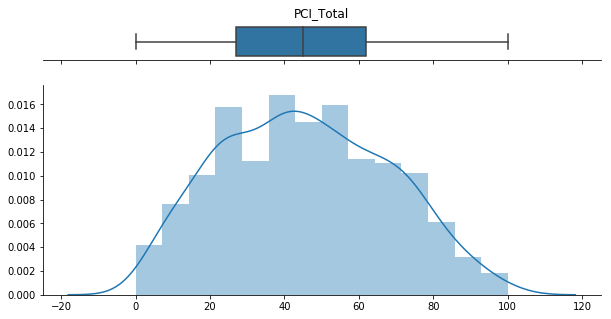

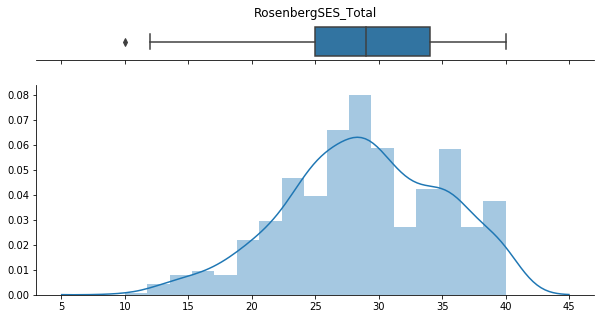

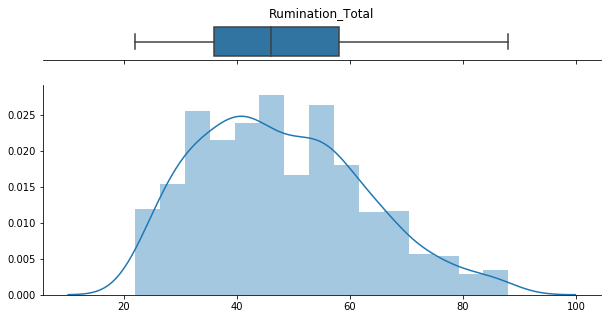

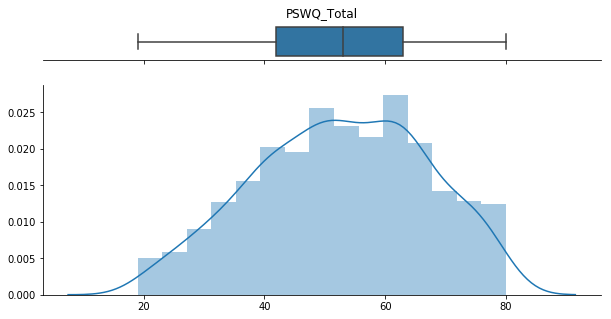

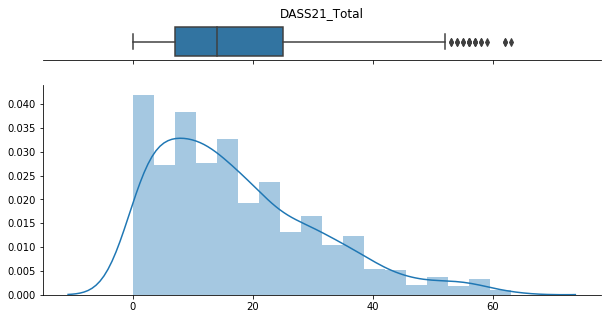

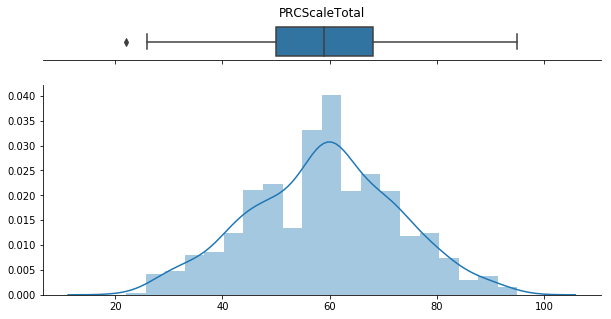

In [103]:
# Check for Outliers
for c in df_features.columns:
    fig, ax = plt.subplots(2, 
                           figsize = (10, 5),
                           sharex = True, 
                           gridspec_kw = {'height_ratios': (0.15, 0.85)})

    ax_box = ax[0]
    ax_box = sns.boxplot(df_features[c], ax = ax_box)
    ax_box.set(title = c, yticks = [], xlabel = '')
    sns.despine(ax = ax_box, left = True)

    ax_hist = ax[1]
    ax_hist = sns.distplot(df_features[c], ax = ax_hist)
    ax_hist.set(xlabel = '')
    sns.despine(ax = ax_hist)

plt.show()

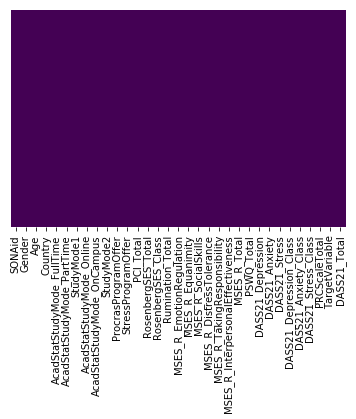

In [104]:
#Check missing data for df
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

In [105]:
#Drop null values in df
df.dropna(inplace=True)

In [106]:
#Drop null values found in df_new
df_new.dropna(inplace=True)

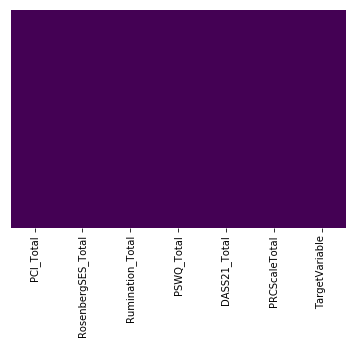

In [107]:
#Check missing data for df_new
sns.heatmap(df_new.isnull(),yticklabels=False,cbar=False,cmap='viridis')

In [108]:
#Ref: https://medium.com/@ozan/interactive-plots-with-plotly-and-cufflinks-on-pandas-dataframes-af6f86f62d94
#Import Plotly and Cufflinks in Offline Mode
import cufflinks as cf
import plotly.offline


#init_notebook_mode(connected=True)
plotly.offline.init_notebook_mode()
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True, theme='ggplot')

In [109]:


# #Dictionary for cleaning up the TargetVariable columns:
        
# cleanup_TargetVariable = {"TargetVariable": {"Withdrawn": 0, "Enrolled": 1}}
                                                                          
# #To convert the variables "TargetVariable"to numbers using replace :

# df.replace(cleanup_TargetVariable, inplace=True);





In [51]:
#Interactive Bar Plot of Target Variable (Showing students who "Enrolled" vs "Withdrawn")
TarVarEnrolled = df.TargetVariable[df.TargetVariable == 'Enrolled'].value_counts()
TarVarWithdrawn = df.TargetVariable[df.TargetVariable == 'Withdrawn'].value_counts()

df_TargetVariable = pd.DataFrame([TarVarEnrolled,TarVarWithdrawn])
df_TargetVariable.index = ['Enrolled','Withdrawn']
df_TargetVariable.iplot(kind='bar',barmode='stack', bargap =0.5, title='Distribution of Target Variable (Enrolled vs Withdrawn)')


##### <font color = blue> Comments: Note class imbalance. 23% less participants in withdrawn.    </font>

In [45]:
# #Value counts of features:
# df.Gender.value_counts()
# #Distribution of Gender
# sns.countplot(x='Gender', data=df);
# plt.title('Distribution of Gender')




In [50]:
#Interactive Bar Plot of Gender (Males vs Females)
Males = df.Gender[df.Gender == 'Male'].value_counts()
Females = df.Gender[df.Gender == 'Female'].value_counts()

df_Gender = pd.DataFrame([Males,Females])
df_Gender.index = ['Males','Females']
df_Gender.iplot(kind='bar',barmode='stack', bargap =0.5, title='Distribution of Gender (Males vs Females)')


In [53]:


# var data = [{x: ['Males', 'Females],
#              y: [197, 728],
#              name: 'Wait times',
#              type: 'bar',
#              hoverinfo: 'y+text',
#              hovertext: ['22%', '33%']}]

# var layout = {title: "Distribution of Gender (Males vs Females)",
#               xaxis: {title: 'Gender'},
#               yaxis: {title: 'Frequency'}}

# Plotly.newPlot('mydiv', data, layout)


### <font color = blue> Comments: Note significantly more females than males.  This is the nature of a typical Psychology course.   </font>

In [47]:
#Interactive histogram of Students' Ages
df.Age.iplot(kind="histogram", bins=30,  title="Distribution of Students' Ages",xTitle='Ages', yTitle='Count')

In [48]:
cf.getThemes()

['ggplot', 'pearl', 'solar', 'space', 'white', 'polar', 'henanigans']

In [49]:
#Distribution of Age across both Genders

MalesAgesOnly=df.Age[df.Gender == 'Male']
FemalesAgesOnly=df.Age[df.Gender == 'Female']

#df_GenderAges = pd.DataFrame([MalesAgesOnly, FemalesAgesOnly])
#[df_GenderAges.MalesAgesOnly, df_GenderAges.FemaleAgesOnly].iplot(kind="histogram", bins=20, title="Students Ages", xTitle='Ages', yTitle='Count')



#Does Not Work
#df_GenderAges.iplot(kind="histogram", bins=20, title="Distribution of Age for Female Students", xTitle='Ages', yTitle='Count')



In [28]:
MalesAgesOnly.iplot(kind="histogram", bins=20,theme='polar', title="Distribution of Age for Male Students", xTitle='Ages', yTitle='Count')

In [29]:
FemalesAgesOnly.iplot(kind="histogram", bins=20,theme='ggplot', title="Distribution of Age for Female Students", xTitle='Ages', yTitle='Count')


In [29]:
#Interactive Histogram Plot showing Distribution of Age across both Genders 

df["Female Ages"]=df[df["Gender"]=="Female"]["Age"]
df["Male Ages"]=df[df["Gender"]=="Male"]["Age"]

df[["Female Ages","Male Ages"]].iplot(kind="histogram", bins=20, theme="ggplot", title="Students' Age by Gender",
         xTitle='Ages', yTitle='Count')




In [27]:
#Enrolment status by Gender

Enrolled_Gender = df[df['TargetVariable']=='Enrolled']['Gender'].value_counts()
Withdrawn_Gender = df[df['TargetVariable']=='Withdrawn']['Gender'].value_counts()
EG_df = pd.DataFrame([Enrolled_Gender,Withdrawn_Gender])
EG_df.index = ['Enrolled','Withdrawn']
EG_df.iplot(kind='bar',barmode='group', title='Enrolment Status(TargetVariable) by Gender')



# #Enrolment status by Gender (will not work)

# Enrolled_Gender = df[df.TargetVariable=='Enrolled'][df.Gender].value_counts()
# Withdrawn_Gender = df[df.TargetVariable=='Withdrawn'][df.Gender].value_counts()
# EG_df = pd.DataFrame([Enrolled_Gender,Withdrawn_Gender])
# EG_df.index = ['Enrolled','Withdrawn']
# EG_df.iplot(kind='bar',barmode='stack', title='Current Enrolment Status by Gender')



# #Enrolment status by Gender (will not work)

# Enrolled_Gender = df[df['TargetVariable']=='Enrolled'][df.Gender].value_counts()
# Withdrawn_Gender = df[df['TargetVariable']=='Withdrawn'][df.Gender].value_counts()
# EG_df = pd.DataFrame([Enrolled_Gender,Withdrawn_Gender])
# EG_df.index = ['Enrolled','Withdrawn']
# EG_df.iplot(kind='bar',barmode='stack', title='Current Enrolment Status by Gender')

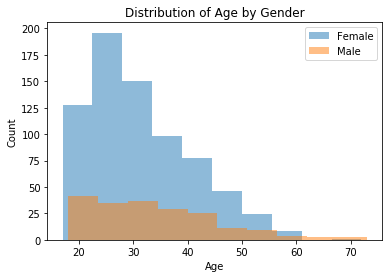

In [36]:
#Distribution of Age by Gender
plt.hist('Age', data=df[df['Gender']=='Female'], alpha=0.5, label='Female'); 
plt.hist('Age', data=df[df['Gender']=='Male'], alpha=0.5, label='Male');
plt.title('Distribution of Age by Gender');
plt.xlabel('Age');
plt.ylabel('Count');
plt.legend();

In [61]:
# #Replace missing string with Nan in variable "StudyMode1"
# import numpy as np
# df['StudyMode1'] = df['StudyMode1'].apply(lambda y: np.nan if len(y)==0 else y)
# print(df['StudyMode1'])

In [56]:
df.StudyMode1.value_counts(normalize=True)*100

FullTime     54.378378
 PartTime    30.054054
             15.567568
Name: StudyMode1, dtype: float64

In [30]:
df.Country.value_counts()

Australia                                               711
                                                        197
Lebanon                                                   2
Austria                                                   2
New Zealand                                               1
Somalia                                                   1
Afghanistan                                               1
Indonesia                                                 1
Viet Nam                                                  1
Philippines                                               1
Sri Lanka                                                 1
Canada                                                    1
United Arab Emirates                                      1
Algeria                                                   1
United Kingdom of Great Britain and Northern Ireland      1
India                                                     1
Armenia                                 

In [34]:
#Interactive Bar Plot of StudyMode1 (Showing students who are "FullTime" vs "PartTime"
#StudyMode1_FT = df.AcadStatStudyMode_FullTime[df.AcadStatStudyMode_FullTime == 'FullTime'].value_counts()

StudyMode1_FT = df.AcadStatStudyMode_FullTime.value_counts()
StudyMode1_PT = df.AcadStatStudyMode_PartTime.value_counts()

df_StudyMode1 = pd.DataFrame([StudyMode1_FT, StudyMode1_PT])
df_StudyMode1.index = ['Full-Time','Part-Time']
df_StudyMode1.iplot(kind='bar', barmode='stack', bargap =0.5, title='Distribution of Study Mode 1 - Full Time vs Part Time Students')



In [35]:
#sns.distplot(df.AcadStatStudyMode_FullTime.dropna(),kde=False,color='darkred',bins=30)

In [36]:
df_StudyMode2 = df.StudyMode2.value_counts()
df_StudyMode2

Online            462
                  241
 OnCampus         150
OnlineOnCampus     72
Name: StudyMode2, dtype: int64

In [37]:

#df_StudyMode2.index = ['OnCampus','Missing', 'OnCampus', "Blended - Online and On Campus"]
df_StudyMode2.iplot(kind='bar', barmode='stack',bargap =0.5,title='Distribution of Study Mode 2 - OnCampus vs OnLine')

In [38]:
df.AcadStatStudyMode_OnCampus.value_counts()

            703
OnCampus    222
Name: AcadStatStudyMode_OnCampus, dtype: int64

In [39]:
df.AcadStatStudyMode_Online.value_counts()

Online    534
          391
Name: AcadStatStudyMode_Online, dtype: int64

In [40]:
#Interactive Bar Plot of StudyMode1 (Showing students who are "FullTime" vs "PartTime"
#StudyMode1_FT = df.AcadStatStudyMode_FullTime[df.AcadStatStudyMode_FullTime == 'FullTime'].value_counts()

StudyMode2_OC = df.AcadStatStudyMode_OnCampus.value_counts()
StudyMode2_OL = df.AcadStatStudyMode_Online.value_counts()

df_StudyMode2 = pd.DataFrame([StudyMode2_OC, StudyMode2_OL])
df_StudyMode2.index = ['OnCampus','OnLine']
df_StudyMode2.iplot(kind='bar', barmode='stack',bargap =0.5,title='Distribution of Study Mode 2 - OnCampus vs OnLine')



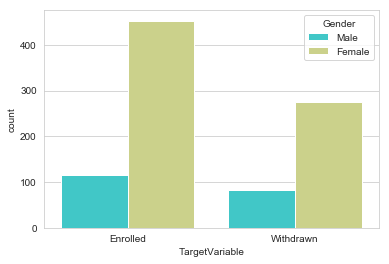

In [41]:
sns.set_style('whitegrid')
sns.countplot(x='TargetVariable',hue='Gender',data=df,palette='rainbow')

In [42]:
#Boxplot of features:

df_new[['PCI_Total','RosenbergSES_Total', 'Rumination_Total','PSWQ_Total', 'DASS21_Depression', 'DASS21_Anxiety','DASS21_Stress', 'PRCScaleTotal']].iplot(kind='box', boxpoints='outliers')

In [43]:
import plotly.plotly as py
import pandas as pd

In [50]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,925.0,31.834595,9.931240,17.0,24.0,30.0,38.0,73.0
PCI_Total,925.0,45.502703,22.408236,0.0,27.0,44.0,62.0,100.0
RosenbergSES_Total,925.0,28.862703,6.158579,10.0,25.0,29.0,34.0,40.0
Rumination_Total,925.0,47.741622,14.630191,22.0,36.0,46.0,58.0,88.0
MSES_R_EmotionRegulation,925.0,13.862703,6.123862,0.0,9.0,14.0,19.0,24.0
MSES_R_Equanimity,925.0,9.627027,2.975791,1.0,8.0,10.0,12.0,16.0
MSES_R_SocialSkills,925.0,7.397838,2.960343,0.0,5.0,8.0,10.0,12.0
MSES_R_DistressTolerance,925.0,7.980541,2.524265,0.0,6.0,8.0,10.0,12.0
MSES_R_TakingResponsibility,925.0,8.354595,2.346982,0.0,7.0,9.0,10.0,12.0
MSES_R_InterpersonalEffectiveness,925.0,8.942703,2.325737,1.0,8.0,9.0,11.0,12.0


In [51]:
df_new.corr().iplot(kind='heatmap',colorscale="Purples",title="Feature Correlation Matrix")

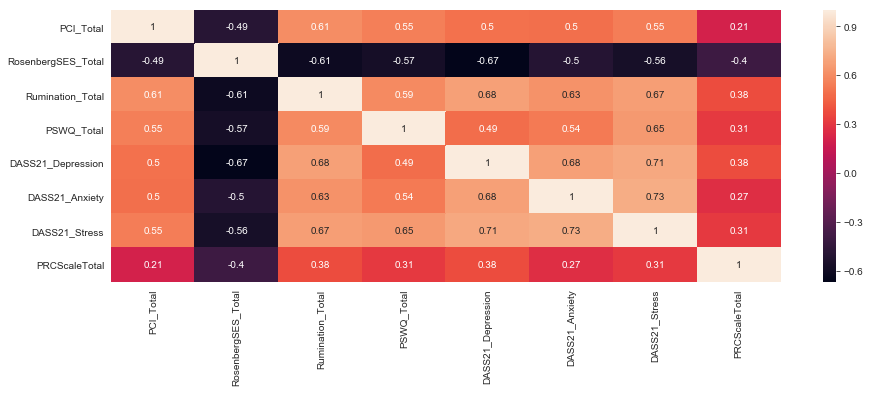

In [52]:
#sns.heatmap((df_new.iloc[:, [0,1,2,3,4,5]]).corr(), annot=True) same as
plt.figure(figsize=(15,5))
sns.heatmap((df_new.iloc[:, 0:8]).corr(), annot=True)

In [54]:
df_features= df_new.drop(['TargetVariable'],axis=1)
colnames=list(df_features.columns)
df_features.scatter_matrix()


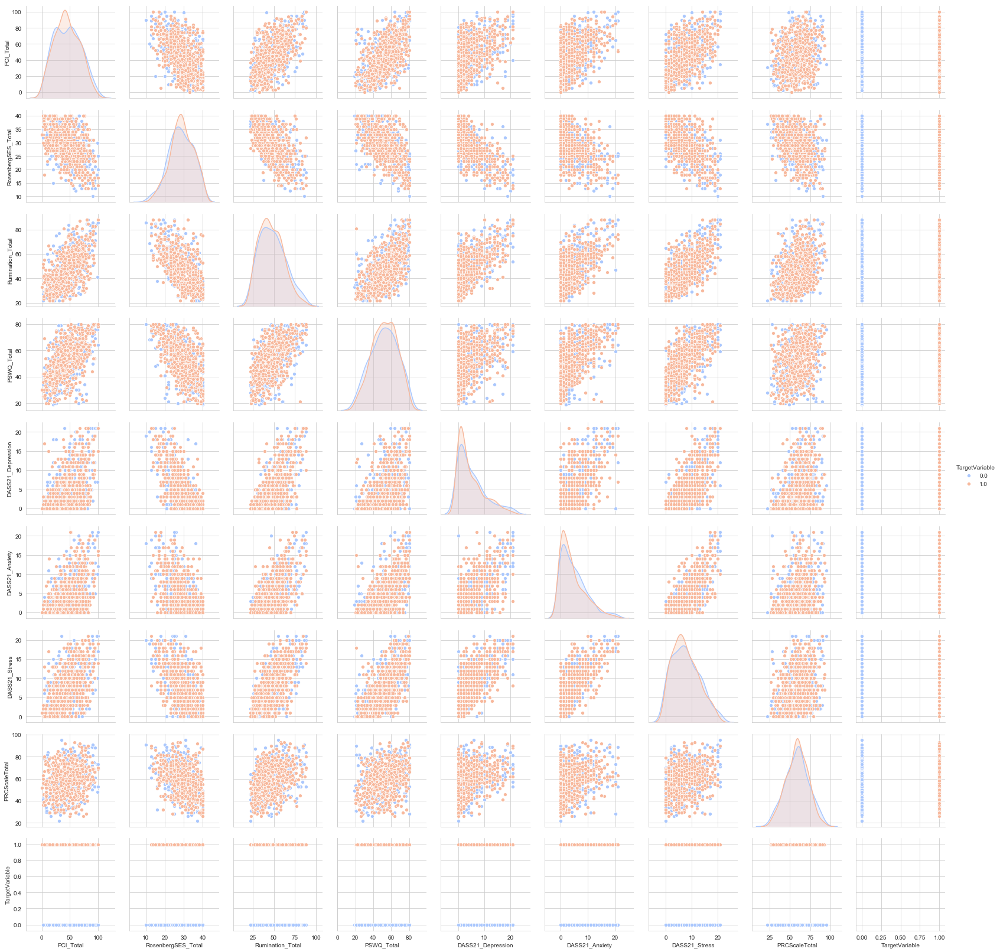

In [56]:
sns.pairplot(df_new, hue='TargetVariable', palette='coolwarm')

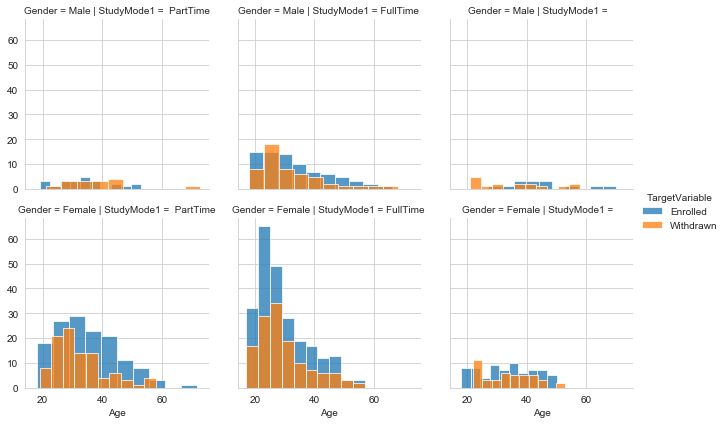

In [48]:
#histogram comparison of gender, class, and age by survival
h = sns.FacetGrid(df, row = 'Gender', col = 'StudyMode1', hue = 'TargetVariable')
h.map(plt.hist, 'Age', alpha = .75)
h.add_legend()


# Defining Features and Target Variable

In [49]:
#Defining the feature set (X) and target variable (y)
#Include 6 features:
X=df_new.iloc[:,0:8] 
y=df_new.iloc[:,8]


# Results of Baseline Model


In [53]:
y.value_counts(normalize=True)


1.0    0.614054
0.0    0.385946
Name: TargetVariable, dtype: float64

In [54]:
#For a classification, the baseline model is the percentage of the biggest class.
#How to calculate this?
#(normalize=True)*100 to calculate the percentage
#normalize=True to normalize to 1
np.max(y.value_counts(normalize=True))

0.614054054054054

# Baseline gives us 61%

## Train Test Split on Raw Data

In [55]:
# Splitting the raw dataset into training set and testing set using train_test_split
from sklearn.model_selection import train_test_split

In [56]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 1118, stratify=y)

## Standardize_the_Features

In [57]:
#Fit the scaler to our data but NOT including the TARGET class "TargetVariable"

#First, import StandardScaler from Scikit learn 
from sklearn.preprocessing import StandardScaler
#Create an instance of a StandardScaler() object called Sc
Sc = StandardScaler()
#Fit Sc to the features:
Sc.fit(df_new.drop('TargetVariable', axis=1))

#Use the .transform() method to transform the features to a scaled version:
scaled_features = Sc.transform(df_new.drop('TargetVariable', axis=1))

#Convert the scaled features to a dataframe and check that the scaling worked.
df_ScaledFeatures = pd.DataFrame(scaled_features, columns=df_new.columns[:-1])
df_ScaledFeatures.head()

,PCI_Total,RosenbergSES_Total,Rumination_Total,PSWQ_Total,DASS21_Depression,DASS21_Anxiety,DASS21_Stress,PRCScaleTotal
0,1.183120,0.022306,-0.666218,0.310553,-0.768732,-0.780491,-1.120698,0.586281
1,-1.361964,1.809398,-1.555272,-2.007207,-0.961592,-0.780491,-1.316773,-0.945462
2,-0.424301,-0.140157,-1.076550,-1.726266,-0.190150,-0.566070,-0.924624,-0.289001
3,0.870566,1.322009,-1.076550,-1.585796,-0.961592,-0.994911,-0.924624,-0.799581
4,0.468711,-0.465083,0.496392,-1.375090,-0.383011,-0.351650,0.643972,0.148640



<a id='Logistic_Regression_Model'></a>

# Model 1: Logistic Regression Model

>## Standardize_The_Features

In [64]:
#Fit the scaler to our data but NOT including the TARGET class "TargetVariable"

#First, import StandardScaler from Scikit learn 
from sklearn.preprocessing import StandardScaler
#Create an instance of a StandardScaler() object called Sc
Sc = StandardScaler()
#Fit Sc to the features:
Sc.fit(df_new.drop('TargetVariable', axis=1))

#Use the .transform() method to transform the features to a scaled version:
scaled_features = Sc.transform(df_new.drop('TargetVariable', axis=1))

#Convert the scaled features to a dataframe and check that the scaling worked.
df_ScaledFeatures = pd.DataFrame(scaled_features, columns=df_new.columns[:-1])
df_ScaledFeatures.head()

,PCI_Total,RosenbergSES_Total,Rumination_Total,PSWQ_Total,DASS21_Depression,DASS21_Anxiety,DASS21_Stress,PRCScaleTotal
0,1.183120,0.022306,-0.666218,0.310553,-0.768732,-0.780491,-1.120698,0.586281
1,-1.361964,1.809398,-1.555272,-2.007207,-0.961592,-0.780491,-1.316773,-0.945462
2,-0.424301,-0.140157,-1.076550,-1.726266,-0.190150,-0.566070,-0.924624,-0.289001
3,0.870566,1.322009,-1.076550,-1.585796,-0.961592,-0.994911,-0.924624,-0.799581
4,0.468711,-0.465083,0.496392,-1.375090,-0.383011,-0.351650,0.643972,0.148640


>## Train Test Split Scaled Features 

In [65]:
#X consists of standardized variables
#y is the target variable
X_train, X_test, y_train, y_test = train_test_split(df_ScaledFeatures, df_new['TargetVariable'], test_size = 0.3, random_state = 1118, stratify=y)

>## Fitting Logistic Regression Model And First Evaluation Of The Model

In [66]:
LRModel = LogisticRegression(random_state=1118)
LRModel.fit(X_train, y_train)
Accuracies_LRModel = cross_val_score(estimator=LRModel, X=df_ScaledFeatures, y=y, cv=10)
print(Accuracies_LRModel)
print('\n')
Accuracies_LRModel.mean()
print(("Mean accuracy of model (& Std) after k-Fold CV : %.3f (%.3f)") % (Accuracies_LRModel.mean(), Accuracies_LRModel.std()))

[0.61290323 0.61290323 0.61290323 0.61290323 0.61290323 0.61290323
 0.59139785 0.56521739 0.48351648 0.6043956 ]


Mean accuracy of model (& Std) after k-Fold CV : 0.592 (0.039)




># Hyperparameter Tuning - Logistic Regression Model

<a id='Grid_Search_-_Logistic_Regression_Model'></a>
>## Grid Search to Find Optimal Parameters
<br>
#Ref: https://scikit-learn.org/stable/auto_examples/compose/plot_column_transformer_mixed_types.html#sphx-glr-auto-examples-compose-plot-column-transformer-mixed-types-py![image.png](attachment:image.png)

In [75]:
from sklearn.model_selection import GridSearchCV

Parameters_LRModel = {'penalty':['l1','l2'],'C':[0.001,0.01,0.1,1,10,1000]}

grid_search = GridSearchCV(estimator = LRModel,
                           param_grid = Parameters_LRModel,
                           scoring = 'accuracy',
                           cv = 10,
                           n_jobs = -1)
grid_search = grid_search.fit(X_train, y_train)
best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_
best_estimator = grid_search.best_estimator_

print("Best accuracy: %.3f "%best_accuracy)
print("-----------------------------")
print("Best parameters are:",best_parameters)
print("-----------------------------")
print("Best estimators are:",best_estimator)

Best accuracy: 0.615 
-----------------------------
Best parameters are: {'C': 1, 'penalty': 'l1'}
-----------------------------
Best estimators are: LogisticRegression(C=1, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l1', random_state=1118, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)


In [79]:
#Rerun grid search with C values closer to 10
from sklearn.model_selection import GridSearchCV

Parameters_LRModel = {'penalty':['l1','l2'],'C': [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8]}

grid_search = GridSearchCV(estimator = LRModel,
                           param_grid = Parameters_LRModel,
                           scoring = 'accuracy',
                           cv = 10,
                           n_jobs = -1)
grid_search = grid_search.fit(X_train, y_train)
best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_
best_estimator = grid_search.best_estimator_

print("Best accuracy: %.3f "%best_accuracy)
print("-----------------------------")
print("Best parameters are:",best_parameters)
print("-----------------------------")
print("Best estimators are:",best_estimator)

Best accuracy: 0.620 
-----------------------------
Best parameters are: {'C': 0.5, 'penalty': 'l1'}
-----------------------------
Best estimators are: LogisticRegression(C=0.5, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l1', random_state=1118, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)


># Retrain Logistic Regression Model Using Parameters from Grid Search (Method 1)

In [80]:
LRModel1 = LogisticRegression(C=0.5, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l1', random_state=1118, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)
LRModel1.fit(X_train, y_train)

y_pred_LRModel1 = LRModel1.predict(X_test)

#Create a classification report for the model
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred_LRModel1 ))
from sklearn.metrics import precision_score
print("-----------------------------------------------------")
print("Precision score: {}".format(precision_score(y_test,y_pred_LRModel1)))
print('\n')
from sklearn.metrics import recall_score
print("Recall score: {}".format(recall_score(y_test,y_pred_LRModel1)))
print('\n')
from sklearn.metrics import f1_score
print("F1 Score: {}".format(f1_score(y_test,y_pred_LRModel1)))

print('\n')
# Making the New Confusion Matrix based on new parameters for model
from sklearn.metrics import confusion_matrix
Con_Matrix_df = pd.DataFrame(confusion_matrix(y_test,y_pred_LRModel1),
             columns=["Predicted Class " + str(class_name) for class_name in [0,1]],
             index = ["Actual Class " + str(class_name) for class_name in [0,1]])

print(Con_Matrix_df)

             precision    recall  f1-score   support

        0.0       0.25      0.01      0.02       107
        1.0       0.61      0.98      0.76       171

avg / total       0.47      0.61      0.47       278

-----------------------------------------------------
Precision score: 0.6131386861313869


Recall score: 0.9824561403508771


F1 Score: 0.7550561797752808


                Predicted Class 0  Predicted Class 1
Actual Class 0                  1                106
Actual Class 1                  3                168


># Retrain Logistic Regression Model Using Parameters from Grid Search (Method 2)

In [81]:
#Re-run predictions based on grid object
grid_predictions=grid_search.predict(X_test)

#Create new classification report for the model based on grid object
from sklearn.metrics import classification_report
print(classification_report(y_test,grid_predictions))
from sklearn.metrics import precision_score
print("-----------------------------------------------------")
print("Precision score: {}".format(precision_score(y_test,grid_predictions)))
print('\n')
from sklearn.metrics import recall_score
print("Recall score: {}".format(recall_score(y_test,grid_predictions)))
print('\n')
from sklearn.metrics import f1_score
print("F1 Score: {}".format(f1_score(y_test,grid_predictions)))
print('\n')
# Making the New Confusion Matrix based on grid object
from sklearn.metrics import confusion_matrix
Con_Matrix_df = pd.DataFrame(confusion_matrix(y_test,grid_predictions),
             columns=["Predicted Class " + str(class_name) for class_name in [0,1]],
             index = ["Actual Class " + str(class_name) for class_name in [0,1]])

print(Con_Matrix_df)

             precision    recall  f1-score   support

        0.0       0.25      0.01      0.02       107
        1.0       0.61      0.98      0.76       171

avg / total       0.47      0.61      0.47       278

-----------------------------------------------------
Precision score: 0.6131386861313869


Recall score: 0.9824561403508771


F1 Score: 0.7550561797752808


                Predicted Class 0  Predicted Class 1
Actual Class 0                  1                106
Actual Class 1                  3                168


># Applying Logistic Regression Model with Grid Search Parameters On k-fold CV Data

In [84]:
Accuracies_LRModel1 = cross_val_score(estimator=LRModel1, X=X_test, y=y_test, cv=10)
print(Accuracies_LRModel1)
print('\n')
Accuracies_LRModel1.mean()
print(("Mean accuracy of model (& Std) after k-Fold CV : %.3f (%.3f)") % (Accuracies_LRModel1.mean(), Accuracies_LRModel1.std()))

[0.55172414 0.60714286 0.64285714 0.64285714 0.60714286 0.60714286
 0.64285714 0.59259259 0.62962963 0.66666667]


Mean accuracy of model (& Std) after k-Fold CV : 0.619 (0.031)


# Plot ROC-AUC Curve 

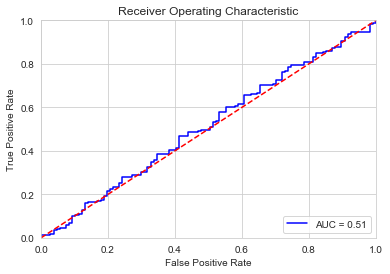

In [85]:
import sklearn.metrics as metrics
# calculate the fpr and tpr for all thresholds of the classification
#predict probabilities
probs = LRModel1.predict_proba(X_test)
#keep probabilites for the positive outcome only
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc = metrics.auc(fpr, tpr)

# method I: plt
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

<a id='KNN_Classification'></a>

# Model 2: K-Nearest Neighbor (KNN) Classification

 <a id='Standardize_the_Features></a>

>## Standardize_The_Features
 #Because the KNN classifier predicts the class of an observation by identifying the observations that are nearest to it, the scale of the variables matters.  Any variables that are on a large scale will have a much larger effect on the distance between the observations, than variables that are on a small scale.

In [86]:
#Fit the scaler to our data but NOT including the TARGET class "TargetVariable"

#First, import StandardScaler from Scikit learn 
from sklearn.preprocessing import StandardScaler
#Create an instance of a StandardScaler() object called Sc
Sc = StandardScaler()
#Fit Sc to the features:
Sc.fit(df_new.drop('TargetVariable', axis=1))

#Use the .transform() method to transform the features to a scaled version:
scaled_features = Sc.transform(df_new.drop('TargetVariable', axis=1))

In [87]:
#Convert the scaled features to a dataframe and check that the scaling worked.
df_ScaledFeatures = pd.DataFrame(scaled_features, columns=df_new.columns[:-1])
df_ScaledFeatures.head()

,PCI_Total,RosenbergSES_Total,Rumination_Total,PSWQ_Total,DASS21_Depression,DASS21_Anxiety,DASS21_Stress,PRCScaleTotal
0,1.183120,0.022306,-0.666218,0.310553,-0.768732,-0.780491,-1.120698,0.586281
1,-1.361964,1.809398,-1.555272,-2.007207,-0.961592,-0.780491,-1.316773,-0.945462
2,-0.424301,-0.140157,-1.076550,-1.726266,-0.190150,-0.566070,-0.924624,-0.289001
3,0.870566,1.322009,-1.076550,-1.585796,-0.961592,-0.994911,-0.924624,-0.799581
4,0.468711,-0.465083,0.496392,-1.375090,-0.383011,-0.351650,0.643972,0.148640


>## Train Test Split Scaled Features 

In [88]:
#X consists of standardized variables
#y is the target variable
X_train, X_test, y_train, y_test = train_test_split(df_ScaledFeatures, df_new['TargetVariable'], test_size = 0.3, random_state = 1118, stratify=y)


>## Fitting KNN Classification Model And First Evaluation Of The Model

In [95]:
# Fitting K-NN to the Training set
from sklearn.neighbors import KNeighborsClassifier

#First create a KNN model instance with n_neighbors=1
KNNModel = KNeighborsClassifier(n_neighbors = 5)

#Fit the KNN model to the training data
KNNModel.fit(X_train, y_train)

Accuracies_KNNModel = cross_val_score(estimator=KNNModel, X=df_ScaledFeatures, y=y, cv=10)
print(Accuracies_KNNModel)
print('\n')
Accuracies_KNNModel.mean()
print(("Mean accuracy of model (& Std) after k-Fold CV : %.3f (%.3f)") % (Accuracies_KNNModel.mean(), Accuracies_KNNModel.std()))


[0.53763441 0.47311828 0.51612903 0.5483871  0.55913978 0.53763441
 0.43010753 0.4673913  0.36263736 0.45054945]


Mean accuracy of model (& Std) after k-Fold CV : 0.488 (0.060)


In [96]:
# # Applying k-Fold Cross Validation to KNN Classification

# #Ref: https://kevinzakka.github.io/2016/07/13/k-nearest-neighbor/
# #Applying k-Fold Cross Validation (Version 1)
# #Here we get the individual, as well as the mean and std deviation of the 10 accuracy scores for each fold
# from sklearn.model_selection import cross_val_score
# Accuracies_KNNModel = cross_val_score(estimator=KNN_Model, X=X_train, y=y_train, cv=10)

# print(Accuracies_KNNModel)
# print('\n')

# Accuracies_KNNModel.mean()
# print(("Accuracy after k-Fold CV (Std): %.3f (%.3f)") % (Accuracies_LRModel.mean(), Accuracies_LRModel.std()))

In [97]:
# #Applying k-Fold Cross Validation (Version 2)
# #Performing a 10-fold cross validation on our dataset using a generated list of odd K’s ranging from 1 to 50.

# # creating odd list of K for KNN
# myList = list(range(1,50))

# # subsetting just the odd ones
# neighbors = filter(lambda x: x % 2 != 0, myList)

# # empty list that will hold cv scores
# cv_scores = []

# # perform 10-fold cross validation
# for k in neighbors:
#     knn = KNeighborsClassifier(n_neighbors=k)
#     scores = cross_val_score(knn, X_train, y_train, cv=10, scoring='accuracy')
#     cv_scores.append(scores.mean())

# print(np.mean(cv_scores))
# print(("Accuracy after k-Fold CV (Std): %.3f(%.3f)")%(np.mean(cv_scores), np.std(cv_scores)))    


<a id='Choosing_a_K_Value_for_KNN_Classification'></a>

># Choosing a K Value for KNN Classification

In [108]:
#Use the elbow method to pick a good K Value
#Create a for loop that trains various KNN models with different k values, then keep track of the error_rate for each of these models with a list.
#Define error_rate as an empty list
error_rate = []

for k in range (1, 50):

    KNNModel = KNeighborsClassifier(n_neighbors=k)
    KNNModel.fit(X_train,y_train)
    pred_i = KNNModel.predict(X_test)
    error_rate.append(np.mean(pred_i != y_test))



TypeError: _init_params() got an unexpected keyword argument 'random_state'

Text(0,0.5,'Error Rate')

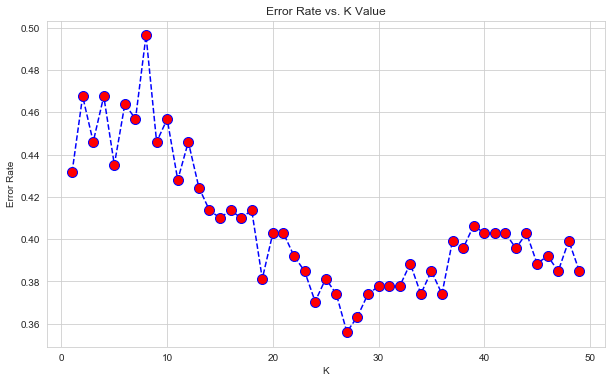

In [99]:
#Create plot using the information from the for loop
plt.figure(figsize=(10,6))
plt.plot(range(1,50), error_rate, color='blue', linestyle='dashed', marker='o', markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')


<a id='Retrain_with_new_K_Value'></a>
># Retrain KNN Model With New K Value

In [110]:
# NOW WITH K=27
KNNModel = KNeighborsClassifier(n_neighbors=27)

KNNModel.fit(X_train,y_train)
y_pred_KNNModel = KNNModel.predict(X_test)


print('WITH K=27')

#Create a classification report for the model
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred_KNNModel ))
from sklearn.metrics import precision_score
print("-----------------------------------------------------")
print("Precision score: {}".format(precision_score(y_test,y_pred_KNNModel)))
print('\n')
from sklearn.metrics import recall_score
print("Recall score: {}".format(recall_score(y_test,y_pred_KNNModel)))
print('\n')
from sklearn.metrics import f1_score
print("F1 Score: {}".format(f1_score(y_test,y_pred_KNNModel)))


print('\n')
# Making the New Confusion Matrix based on new parameters for model
from sklearn.metrics import confusion_matrix
Con_Matrix_df = pd.DataFrame(confusion_matrix(y_test,y_pred_KNNModel),
             columns=["Predicted Class " + str(class_name) for class_name in [0,1]],
             index = ["Actual Class " + str(class_name) for class_name in [0,1]])

print(Con_Matrix_df)




WITH K=27
             precision    recall  f1-score   support

        0.0       0.72      0.12      0.21       107
        1.0       0.64      0.97      0.77       171

avg / total       0.67      0.64      0.55       278

-----------------------------------------------------
Precision score: 0.6384615384615384


Recall score: 0.9707602339181286


F1 Score: 0.7703016241299303


                Predicted Class 0  Predicted Class 1
Actual Class 0                 13                 94
Actual Class 1                  5                166


<a id='Grid_Search_KNN_Classification'></a>

># Hyperparameter Tuning - KNN Classification


<br>
Ref: https://medium.com/@erikgreenj/k-neighbors-classifier-with-gridsearchcv-basics-3c445ddeb657

>## Grid Search to Find Optimal Parameters

In [111]:
#Grid search - KNN Classification (Part 1)

from sklearn.model_selection import GridSearchCV
Parameters_KNNModel = {'n_neighbors': range(20,30),'weights':['uniform', 'distance'], 'metric':['euclidean','manhattan']}

grid_search = GridSearchCV(estimator = KNNModel,
                           param_grid = Parameters_KNNModel,
                           verbose = 1,
                           cv = 10,
                           n_jobs = -1)

grid_search = grid_search.fit(X_train, y_train)
best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_
best_estimator = grid_search.best_estimator_

print("Best accuracy: %.3f "%best_accuracy)
print("-----------------------------")
print("Best parameters are:",best_parameters)
print("-----------------------------")
print("Best estimators are:",best_estimator)

Fitting 10 folds for each of 40 candidates, totalling 400 fits


[Parallel(n_jobs=-1)]: Done 180 tasks      | elapsed:    2.2s


Best accuracy: 0.618 
-----------------------------
Best parameters are: {'metric': 'manhattan', 'n_neighbors': 29, 'weights': 'uniform'}
-----------------------------
Best estimators are: KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
           metric_params=None, n_jobs=1, n_neighbors=29, p=2,
           weights='uniform')


[Parallel(n_jobs=-1)]: Done 400 out of 400 | elapsed:    4.6s finished


># Retrain KNN Model Using Parameters from Grid Search (Method 1)

In [115]:
KNNModel1 = KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
           metric_params=None, n_jobs=1, n_neighbors=29, p=2,
           weights='uniform')
KNNModel1.fit(X_train, y_train)

y_pred_KNNModel1 = KNNModel1.predict(X_test)

#Create a classification report for the model
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred_KNNModel1))
from sklearn.metrics import precision_score
print("-----------------------------------------------------")
print("Precision score: {}".format(precision_score(y_test,y_pred_KNNModel1)))
print('\n')
from sklearn.metrics import recall_score
print("Recall score: {}".format(recall_score(y_test,y_pred_KNNModel1)))
print('\n')
from sklearn.metrics import f1_score
print("F1 Score: {}".format(f1_score(y_test,y_pred_KNNModel1)))

print('\n')

# Making the New Confusion Matrix based on new parameters for model
from sklearn.metrics import confusion_matrix
Con_Matrix_df = pd.DataFrame(confusion_matrix(y_test,y_pred_KNNModel1),
             columns=["Predicted Class " + str(class_name) for class_name in [0,1]],
             index = ["Actual Class " + str(class_name) for class_name in [0,1]])

print(Con_Matrix_df)

             precision    recall  f1-score   support

        0.0       0.29      0.05      0.08       107
        1.0       0.61      0.93      0.74       171

avg / total       0.49      0.59      0.48       278

-----------------------------------------------------
Precision score: 0.6091954022988506


Recall score: 0.9298245614035088


F1 Score: 0.7361111111111112


                Predicted Class 0  Predicted Class 1
Actual Class 0                  5                102
Actual Class 1                 12                159


># Retrain KNN Model Using Parameters from Grid Search (Method 2)

In [116]:
#Re-run predictions based on grid object
grid_predictions=grid_search.predict(X_test)

#Create new classification report for the model based on grid object
from sklearn.metrics import classification_report
print(classification_report(y_test,grid_predictions))
from sklearn.metrics import precision_score
print("-----------------------------------------------------")
print("Precision score: {}".format(precision_score(y_test,grid_predictions)))
print('\n')
from sklearn.metrics import recall_score
print("Recall score: {}".format(recall_score(y_test,grid_predictions)))
print('\n')
from sklearn.metrics import f1_score
print("F1 Score: {}".format(f1_score(y_test,grid_predictions)))
print('\n')
# Making the New Confusion Matrix based on grid object
from sklearn.metrics import confusion_matrix
Con_Matrix_df = pd.DataFrame(confusion_matrix(y_test,grid_predictions),
             columns=["Predicted Class " + str(class_name) for class_name in [0,1]],
             index = ["Actual Class " + str(class_name) for class_name in [0,1]])

print(Con_Matrix_df)

             precision    recall  f1-score   support

        0.0       0.29      0.05      0.08       107
        1.0       0.61      0.93      0.74       171

avg / total       0.49      0.59      0.48       278

-----------------------------------------------------
Precision score: 0.6091954022988506


Recall score: 0.9298245614035088


F1 Score: 0.7361111111111112


                Predicted Class 0  Predicted Class 1
Actual Class 0                  5                102
Actual Class 1                 12                159


># Applying KNN Model with Grid Search Parameters On k-fold CV Data

In [117]:
Accuracies_KNNModel1 = cross_val_score(estimator=KNNModel1, X=X_test, y=y_test, cv=10)
print(Accuracies_KNNModel1)
print('\n')
Accuracies_KNNModel1.mean()
print(("Mean accuracy of model (& Std) after k-Fold CV : %.3f (%.3f)") % (Accuracies_KNNModel1.mean(), Accuracies_KNNModel1.std()))

[0.55172414 0.60714286 0.53571429 0.57142857 0.60714286 0.60714286
 0.60714286 0.66666667 0.59259259 0.62962963]


Mean accuracy of model (& Std) after k-Fold CV : 0.598 (0.036)


># Plot ROC-AUC Curve 

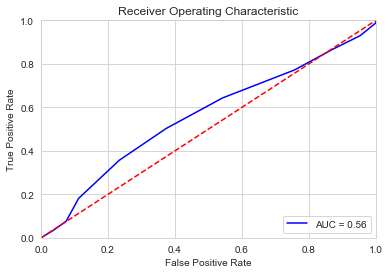

In [118]:
import sklearn.metrics as metrics
# calculate the fpr and tpr for all thresholds of the classification
#predict probabilities
probs = KNNModel1.predict_proba(X_test)
#keep probabilites for the positive outcome only
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc = metrics.auc(fpr, tpr)

# method I: plt
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

<a id='Support_Vector_Machine'></a>

# Model 3: Support Vector Classifier Model



>## Standardize_The_Features

In [119]:
#Fit the scaler to our data but NOT including the TARGET class "TargetVariable"

#First, import StandardScaler from Scikit learn 
from sklearn.preprocessing import StandardScaler
#Create an instance of a StandardScaler() object called Sc
Sc = StandardScaler()
#Fit Sc to the features:
Sc.fit(df_new.drop('TargetVariable', axis=1))

#Use the .transform() method to transform the features to a scaled version:
scaled_features = Sc.transform(df_new.drop('TargetVariable', axis=1))

#Convert the scaled features to a dataframe and check that the scaling worked.
df_ScaledFeatures = pd.DataFrame(scaled_features, columns=df_new.columns[:-1])
df_ScaledFeatures.head()

,PCI_Total,RosenbergSES_Total,Rumination_Total,PSWQ_Total,DASS21_Depression,DASS21_Anxiety,DASS21_Stress,PRCScaleTotal
0,1.183120,0.022306,-0.666218,0.310553,-0.768732,-0.780491,-1.120698,0.586281
1,-1.361964,1.809398,-1.555272,-2.007207,-0.961592,-0.780491,-1.316773,-0.945462
2,-0.424301,-0.140157,-1.076550,-1.726266,-0.190150,-0.566070,-0.924624,-0.289001
3,0.870566,1.322009,-1.076550,-1.585796,-0.961592,-0.994911,-0.924624,-0.799581
4,0.468711,-0.465083,0.496392,-1.375090,-0.383011,-0.351650,0.643972,0.148640


>## Train Test Split Scaled Features 

In [120]:
#X consists of standardized variables
#y is the target variable
X_train, X_test, y_train, y_test = train_test_split(df_ScaledFeatures, df_new['TargetVariable'], test_size = 0.3, random_state = 1118, stratify=y)

In [121]:

# Splitting the dataset into training set and testing set using train_test_split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 1118, stratify=y)



>## Fitting Support Vector Classifier Model And First Evaluation Of The Model

In [122]:
from sklearn.svm import SVC
SVCModel=SVC(random_state=1118)
SVCModel.fit(X_train, y_train)

Accuracies_SVCModel = cross_val_score(estimator=SVCModel, X=df_ScaledFeatures, y=y, cv=10)
print(Accuracies_SVCModel)
print('\n')
Accuracies_SVCModel.mean()
print(("Mean accuracy of model (& Std) after k-Fold CV : %.3f (%.3f)") % (Accuracies_SVCModel.mean(), Accuracies_SVCModel.std()))

[0.61290323 0.61290323 0.61290323 0.61290323 0.60215054 0.61290323
 0.61290323 0.57608696 0.42857143 0.61538462]


Mean accuracy of model (& Std) after k-Fold CV : 0.590 (0.055)


># Hyperparameter Tuning - Support Vector Classifier Model

>## Grid Search to Find Optimal Parameters

In [123]:
#Grid search - SVC Classification 

from sklearn.model_selection import GridSearchCV


Parameters_SVCModel = [{'C': [0.1, 1, 10, 100, 1000], 'kernel': ['linear'], 'gamma': [0.1, 0.2, 0.3, 0.4, 0.5]}, {'C': [0.1, 1, 10, 100, 1000], 'kernel': ['rbf'], 'gamma': [0.1, 0.2, 0.3, 0.4, 0.5]}]


grid_search = GridSearchCV(SVC(),
                           param_grid = Parameters_SVCModel,
                           verbose = 1,
                           cv = 5,
                           n_jobs = -1)

grid_search = grid_search.fit(X_train, y_train)
best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_
best_estimator = grid_search.best_estimator_

print("Best accuracy: %.3f "%best_accuracy)
print("-----------------------------")
print("Best parameters are:",best_parameters)
print("-----------------------------")
print("Best estimators are:",best_estimator)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Done 131 tasks      | elapsed: 16.3min
[Parallel(n_jobs=-1)]: Done 243 out of 250 | elapsed: 16.4min remaining:   28.3s


Best accuracy: 0.614 
-----------------------------
Best parameters are: {'C': 0.1, 'gamma': 0.1, 'kernel': 'linear'}
-----------------------------
Best estimators are: SVC(C=0.1, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma=0.1, kernel='linear',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)


[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed: 48.4min finished


In [124]:
#Rerun grid search with C values closer to 0.1
from sklearn.model_selection import GridSearchCV
Parameters_SVCModel = {'C': [0.07, 0.08, 0.09, 0.1, 0.2,0.3], 'gamma': [0.1,0.2,0.3,0.4,0.5], 'kernel': ['linear']} 

#Parameters_SVCModel = [{'C': [0.07, 0.08, 0.09, 0.1, 0.2, 0.3, 0.4, 0.5], 'kernel': ['linear']}, {'C': [0.1, 1, 10, 100, 1000], 'kernel': ['rbf'], 'gamma': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]}]


grid_search = GridSearchCV(SVC(),
                           param_grid = Parameters_SVCModel,
                           verbose = 1,
                           cv = 10,
                           n_jobs = -1)
grid_search = grid_search.fit(X_train, y_train)
best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_
best_estimator = grid_search.best_estimator_

print("Best accuracy: %.3f "%best_accuracy)
print("-----------------------------")
print("Best parameters are:",best_parameters)
print("-----------------------------")
print("Best estimators are:",best_estimator)

Fitting 10 folds for each of 30 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Done 144 tasks      | elapsed:    1.6s


Best accuracy: 0.614 
-----------------------------
Best parameters are: {'C': 0.07, 'gamma': 0.1, 'kernel': 'linear'}
-----------------------------
Best estimators are: SVC(C=0.07, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma=0.1, kernel='linear',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)


[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    4.1s finished


># Retrain Support Vector Classifier Model Using Parameters from Grid Search (Method 1)

In [125]:
SVCModel1 = SVC(C=0.07, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma=0.1, kernel='linear',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)
                
SVCModel1.fit(X_train, y_train)

y_pred_SVCModel1 = SVCModel1.predict(X_test)

#Create a classification report for the model
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred_SVCModel1))
from sklearn.metrics import precision_score
print("-----------------------------------------------------")
print("Precision score: {}".format(precision_score(y_test,y_pred_SVCModel1)))
print('\n')
from sklearn.metrics import recall_score
print("Recall score: {}".format(recall_score(y_test,y_pred_SVCModel1)))
print('\n')
from sklearn.metrics import f1_score
print("F1 Score: {}".format(f1_score(y_test,y_pred_SVCModel1)))

print('\n')
# Making the New Confusion Matrix based on new parameters for model
from sklearn.metrics import confusion_matrix
Con_Matrix_df = pd.DataFrame(confusion_matrix(y_test,y_pred_SVCModel1),
             columns=["Predicted Class " + str(class_name) for class_name in [0,1]],
             index = ["Actual Class " + str(class_name) for class_name in [0,1]])

print(Con_Matrix_df)

             precision    recall  f1-score   support

        0.0       0.00      0.00      0.00       107
        1.0       0.62      1.00      0.76       171

avg / total       0.38      0.62      0.47       278

-----------------------------------------------------
Precision score: 0.6151079136690647


Recall score: 1.0


F1 Score: 0.7616926503340757


                Predicted Class 0  Predicted Class 1
Actual Class 0                  0                107
Actual Class 1                  0                171


># Retrain Support Vector Classifier Model Using Parameters from Grid Search (Method 2)

In [126]:
#Re-run predictions based on grid object
grid_predictions=grid_search.predict(X_test)

#Create new classification report for the model based on grid object
from sklearn.metrics import classification_report
print(classification_report(y_test,grid_predictions))
from sklearn.metrics import precision_score
print("-----------------------------------------------------")
print("Precision score: {}".format(precision_score(y_test,grid_predictions)))
print('\n')
from sklearn.metrics import recall_score
print("Recall score: {}".format(recall_score(y_test,grid_predictions)))
print('\n')
from sklearn.metrics import f1_score
print("F1 Score: {}".format(f1_score(y_test,grid_predictions)))
print('\n')
# Making the New Confusion Matrix based on grid object
from sklearn.metrics import confusion_matrix
Con_Matrix_df = pd.DataFrame(confusion_matrix(y_test,grid_predictions),
             columns=["Predicted Class " + str(class_name) for class_name in [0,1]],
             index = ["Actual Class " + str(class_name) for class_name in [0,1]])

print(Con_Matrix_df)

             precision    recall  f1-score   support

        0.0       0.00      0.00      0.00       107
        1.0       0.62      1.00      0.76       171

avg / total       0.38      0.62      0.47       278

-----------------------------------------------------
Precision score: 0.6151079136690647


Recall score: 1.0


F1 Score: 0.7616926503340757


                Predicted Class 0  Predicted Class 1
Actual Class 0                  0                107
Actual Class 1                  0                171


># Applying Support Vector Classifier Model with Grid Search Parameters On k-fold CV Data

In [127]:
Accuracies_SVCModel1 = cross_val_score(estimator=SVCModel1, X=X_test, y=y_test, cv=10)
print(Accuracies_SVCModel1)
print('\n')
Accuracies_SVCModel1 .mean()
print(("Mean accuracy of model (& Std) after k-Fold CV : %.3f (%.3f)") % (Accuracies_SVCModel1 .mean(), Accuracies_SVCModel1.std()))

[0.62068966 0.60714286 0.60714286 0.60714286 0.60714286 0.60714286
 0.60714286 0.62962963 0.62962963 0.62962963]


Mean accuracy of model (& Std) after k-Fold CV : 0.615 (0.010)


># Plot ROC-AUC Curve 

In [128]:
import sklearn.metrics as metrics
# calculate the fpr and tpr for all thresholds of the classification
#predict probabilities
probs = SVCModel1.predict_proba(X_test)
#keep probabilites for the positive outcome only
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc = metrics.auc(fpr, tpr)

# method I: plt
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

AttributeError: predict_proba is not available when  probability=False

<a id='Naive_Bayes'></a>

# Model 4: Naive Bayes


>## Standardize_The_Features

In [129]:
#Fit the scaler to our data but NOT including the TARGET class "TargetVariable"

#First, import StandardScaler from Scikit learn 
from sklearn.preprocessing import StandardScaler
#Create an instance of a StandardScaler() object called Sc
Sc = StandardScaler()
#Fit Sc to the features:
Sc.fit(df_new.drop('TargetVariable', axis=1))

#Use the .transform() method to transform the features to a scaled version:
scaled_features = Sc.transform(df_new.drop('TargetVariable', axis=1))

#Convert the scaled features to a dataframe and check that the scaling worked.
df_ScaledFeatures = pd.DataFrame(scaled_features, columns=df_new.columns[:-1])
df_ScaledFeatures.head()

,PCI_Total,RosenbergSES_Total,Rumination_Total,PSWQ_Total,DASS21_Depression,DASS21_Anxiety,DASS21_Stress,PRCScaleTotal
0,1.183120,0.022306,-0.666218,0.310553,-0.768732,-0.780491,-1.120698,0.586281
1,-1.361964,1.809398,-1.555272,-2.007207,-0.961592,-0.780491,-1.316773,-0.945462
2,-0.424301,-0.140157,-1.076550,-1.726266,-0.190150,-0.566070,-0.924624,-0.289001
3,0.870566,1.322009,-1.076550,-1.585796,-0.961592,-0.994911,-0.924624,-0.799581
4,0.468711,-0.465083,0.496392,-1.375090,-0.383011,-0.351650,0.643972,0.148640


>## Train Test Split Scaled Features 

In [130]:
#X consists of standardized variables
#y is the target variable
X_train, X_test, y_train, y_test = train_test_split(df_ScaledFeatures, df_new['TargetVariable'], test_size = 0.3, random_state = 1118, stratify=y)

>## Fitting Naive Bayes Model And First Evaluation Of The Model



In [142]:
from sklearn.naive_bayes import GaussianNB;
GNBModel = GaussianNB()
GNBModel.fit(X_train, y_train)

Accuracies_GNBModel = cross_val_score(estimator=GNBModel, X=df_ScaledFeatures, y=y, cv=10)
print(Accuracies_GNBModel)
print('\n')
Accuracies_GNBModel.mean()
print(("Mean accuracy of model (& Std) after k-Fold CV : %.3f (%.3f)") % (Accuracies_GNBModel.mean(), Accuracies_GNBModel.std()))



[0.61290323 0.62365591 0.61290323 0.61290323 0.59139785 0.6344086
 0.49462366 0.32608696 0.42857143 0.46153846]


Mean accuracy of model (& Std) after k-Fold CV : 0.540 (0.100)


>## No Hyperparameter tuning for Naive Bayes Model

In [143]:


y_pred_GNBModel = GNBModel.predict(X_test)

#Create a classification report for the model
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred_GNBModel))
from sklearn.metrics import precision_score
print("-----------------------------------------------------")
print("Precision score: {}".format(precision_score(y_test,y_pred_GNBModel)))
print('\n')
from sklearn.metrics import recall_score
print("Recall score: {}".format(recall_score(y_test,y_pred_GNBModel)))
print('\n')
from sklearn.metrics import f1_score
print("F1 Score: {}".format(f1_score(y_test,y_pred_GNBModel)))

print('\n')
# Making the New Confusion Matrix based on new parameters for model
from sklearn.metrics import confusion_matrix
Con_Matrix_df = pd.DataFrame(confusion_matrix(y_test,y_pred_GNBModel),
             columns=["Predicted Class " + str(class_name) for class_name in [0,1]],
             index = ["Actual Class " + str(class_name) for class_name in [0,1]])

print(Con_Matrix_df)

             precision    recall  f1-score   support

        0.0       0.47      0.19      0.27       107
        1.0       0.63      0.87      0.73       171

avg / total       0.57      0.60      0.55       278

-----------------------------------------------------
Precision score: 0.6297872340425532


Recall score: 0.8654970760233918


F1 Score: 0.729064039408867


                Predicted Class 0  Predicted Class 1
Actual Class 0                 20                 87
Actual Class 1                 23                148


<a id='kFold_Cross_Validation_on_Naive_Bayes_Model'></a>

>## Applying k-Fold Cross Validation on Naive Bayes Model


In [144]:
Accuracies_GNBModel = cross_val_score(estimator=GNBModel, X=X_test, y=y_test, cv=10)
print(Accuracies_GNBModel)
print('\n')
Accuracies_GNBModel.mean()
print(("Mean accuracy of model (& Std) after k-Fold CV : %.3f (%.3f)") % (Accuracies_GNBModel.mean(), Accuracies_GNBModel.std()))

[0.55172414 0.71428571 0.46428571 0.46428571 0.57142857 0.57142857
 0.67857143 0.48148148 0.62962963 0.59259259]


Mean accuracy of model (& Std) after k-Fold CV : 0.572 (0.082)


># Plot ROC-AUC Curve
Ref: https://stackoverflow.com/questions/25009284/how-to-plot-roc-curve-in-python <br>
Ref: https://machinelearningmastery.com/roc-curves-and-precision-recall-curves-for-classification-in-python/

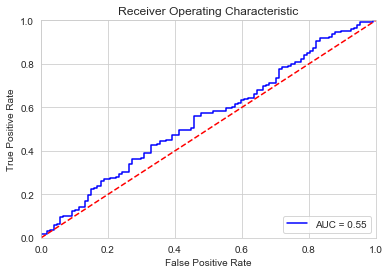

In [145]:
import sklearn.metrics as metrics
# calculate the fpr and tpr for all thresholds of the classification
#predict probabilities
probs = GNBModel.predict_proba(X_test)
#keep probabilites for the positive outcome only
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc = metrics.auc(fpr, tpr)

# method I: plt
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()


<a id='Decision_Tree'></a>
# Model 5: Decision Tree


>## Train Test Split on Raw Data

In [146]:
# Splitting the raw dataset into training set and testing set using train_test_split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 1118, stratify=y)

<a id='Fitting_Decision_Tree'></a>

>## Fitting Decision Tree Model And First Evaluation Of The Model

In [147]:
from sklearn.tree import DecisionTreeClassifier
DTModel=DecisionTreeClassifier(random_state=1118)
DTModel.fit(X, y)
Accuracies_DTModel = cross_val_score(estimator=DTModel, X=X, y=y, cv=10)
print(Accuracies_DTModel)
print('\n')
Accuracies_DTModel.mean()
print(("Mean accuracy of model (& Std) after k-Fold CV : %.3f (%.3f)") % (Accuracies_DTModel.mean(), Accuracies_DTModel.std()))




[0.53763441 0.37634409 0.50537634 0.62365591 0.46236559 0.43010753
 0.50537634 0.5        0.31868132 0.42857143]


Mean accuracy of model (& Std) after k-Fold CV : 0.469 (0.082)


In [138]:
#Results are worse than baseline (61%)

># Hyperparameter Tuning - Decision Tree Model

>## Grid Search to Find Optimal Parameters

In [148]:
from sklearn.model_selection import GridSearchCV

#Parameters_DTreeModel = {'min_samples_split' : range(10,500,20),'max_depth': range(1,20,2), 'max_features': [1, 2, 3, 4, 6,7]}
Parameters_DTModel = {'min_samples_split' : range(10,500,10),'max_depth': range(1,20,2),'max_features':range(1,7,1)}

#cross_validation = StratifiedKFold(all_classes, n_folds=10)

grid_search = GridSearchCV(estimator = DTModel,
                           param_grid = Parameters_DTModel,
                           scoring = 'accuracy',
                           cv = 10,
                           n_jobs = -1)
grid_search = grid_search.fit(X_train, y_train)
best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_
best_estimator = grid_search.best_estimator_

print("Best accuracy: %.3f "%best_accuracy)
print("-----------------------------")
print("Best parameters are:",best_parameters)
print("-----------------------------")
print("Best estimators are:",best_estimator)

Best accuracy: 0.621 
-----------------------------
Best parameters are: {'max_depth': 5, 'max_features': 3, 'min_samples_split': 270}
-----------------------------
Best estimators are: DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=5,
            max_features=3, max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=270, min_weight_fraction_leaf=0.0,
            presort=False, random_state=1118, splitter='best')


In [140]:
#Slightly better results after grid search but still worse than baseline!

># Retrain Decision Tree Model Using Parameters from Grid Search (Method 1)

In [149]:
DTModel1 = DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=5,
            max_features=3, max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=270, min_weight_fraction_leaf=0.0,
            presort=False, random_state=1118, splitter='best')

DTModel1.fit(X_train, y_train)

y_pred_DTModel1 = DTModel1.predict(X_test)

#Create a classification report for the model
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred_DTModel1))
from sklearn.metrics import precision_score
print("-----------------------------------------------------")
print("Precision score: {}".format(precision_score(y_test,y_pred_DTModel1)))
print('\n')
from sklearn.metrics import recall_score
print("Recall score: {}".format(recall_score(y_test,y_pred_DTModel1)))
print('\n')
from sklearn.metrics import f1_score
print("F1 Score: {}".format(f1_score(y_test,y_pred_DTModel1)))

print('\n')
# Making the New Confusion Matrix based on new parameters for model
from sklearn.metrics import confusion_matrix
Con_Matrix_df = pd.DataFrame(confusion_matrix(y_test,y_pred_DTModel1),
             columns=["Predicted Class " + str(class_name) for class_name in [0,1]],
             index = ["Actual Class " + str(class_name) for class_name in [0,1]])

print(Con_Matrix_df)

             precision    recall  f1-score   support

        0.0       0.44      0.17      0.24       107
        1.0       0.62      0.87      0.73       171

avg / total       0.55      0.60      0.54       278

-----------------------------------------------------
Precision score: 0.6244725738396625


Recall score: 0.8654970760233918


F1 Score: 0.7254901960784313


                Predicted Class 0  Predicted Class 1
Actual Class 0                 18                 89
Actual Class 1                 23                148


># Retrain Decision Tree Model Using Parameters from Grid Search (Method 2)

In [150]:
#Re-run predictions based on grid object
grid_predictions=grid_search.predict(X_test)

#Create new classification report for the model based on grid object
from sklearn.metrics import classification_report
print(classification_report(y_test,grid_predictions))
from sklearn.metrics import precision_score
print("-----------------------------------------------------")
print("Precision score: {}".format(precision_score(y_test,grid_predictions)))
print('\n')
from sklearn.metrics import recall_score
print("Recall score: {}".format(recall_score(y_test,grid_predictions)))
print('\n')
from sklearn.metrics import f1_score
print("F1 Score: {}".format(f1_score(y_test,grid_predictions)))
print('\n')
# Making the New Confusion Matrix based on grid object
from sklearn.metrics import confusion_matrix
Con_Matrix_df = pd.DataFrame(confusion_matrix(y_test,grid_predictions),
             columns=["Predicted Class " + str(class_name) for class_name in [0,1]],
             index = ["Actual Class " + str(class_name) for class_name in [0,1]])

print(Con_Matrix_df)

             precision    recall  f1-score   support

        0.0       0.44      0.17      0.24       107
        1.0       0.62      0.87      0.73       171

avg / total       0.55      0.60      0.54       278

-----------------------------------------------------
Precision score: 0.6244725738396625


Recall score: 0.8654970760233918


F1 Score: 0.7254901960784313


                Predicted Class 0  Predicted Class 1
Actual Class 0                 18                 89
Actual Class 1                 23                148


># Applying Decision Tree Model with Grid Search Parameters On k-fold CV Data

In [151]:
Accuracies_DTModel1 = cross_val_score(estimator=DTModel1, X=X_test, y=y_test, cv=10)
print(Accuracies_DTModel1)
print('\n')
Accuracies_DTModel1.mean()
print(("Mean accuracy of model (& Std) after k-Fold CV : %.3f (%.3f)") % (Accuracies_DTModel1.mean(), Accuracies_DTModel1.std()))

[0.62068966 0.60714286 0.60714286 0.60714286 0.60714286 0.60714286
 0.60714286 0.62962963 0.62962963 0.62962963]


Mean accuracy of model (& Std) after k-Fold CV : 0.615 (0.010)


># Plot ROC-AUC Curve 

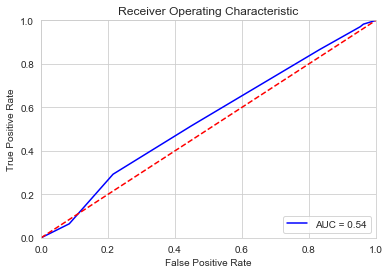

In [152]:
import sklearn.metrics as metrics
# calculate the fpr and tpr for all thresholds of the classification
#predict probabilities
probs = DTModel1.predict_proba(X_test)
#keep probabilites for the positive outcome only
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc = metrics.auc(fpr, tpr)

# method I: plt
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# Bagging

# Random Forest

>## Train Test Split on Raw Data

In [ ]:
# Splitting the raw dataset into training set and testing set using train_test_split
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 1118, stratify=y)

>## Fitting Random Forest Model And First Evaluation Of The Model

In [167]:
#Random Forest Classification
from sklearn import model_selection
from sklearn.ensemble import RandomForestClassifier

num_trees = 1000
RFCModel = RandomForestClassifier(n_estimators = num_trees, random_state = 1118)
RFCModel.fit(X_train, y_train)

Accuracies_RFCModel = cross_val_score(estimator=RFCModel, X=X, y=y, cv=10)
print(Accuracies_RFCModel)
print('\n')
      
Accuracies_RFCModel.mean()
print(("Mean accuracy of model (& Std) after k-Fold CV : %.3f (%.3f)") % (Accuracies_RFCModel.mean(), Accuracies_RFCModel.std()))


[0.59139785 0.52688172 0.55913978 0.64516129 0.55913978 0.55913978
 0.41935484 0.40217391 0.26373626 0.54945055]


Mean accuracy of model (& Std) after k-Fold CV : 0.508 (0.107)


># Hyperparameter Tuning - Random Forest Model

In [163]:
from sklearn.model_selection import GridSearchCV
Parameters_RFCModel = {'n_estimators': [100,500,1000],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy']}


grid_search = GridSearchCV(estimator = RFCModel,
                           param_grid = Parameters_RFCModel,
                           scoring = 'accuracy',
                           cv = 10,
                           n_jobs = -1)

grid_search = grid_search.fit(X_train, y_train)
best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_
best_estimator = grid_search.best_estimator_

print("Best accuracy: %.3f "%best_accuracy)
print("-----------------------------")
print("Best parameters are:",best_parameters)
print("-----------------------------")
print("Best estimators are:",best_estimator)

Best accuracy: 0.618 
-----------------------------
Best parameters are: {'criterion': 'entropy', 'max_depth': 4, 'max_features': 'auto', 'n_estimators': 500}
-----------------------------
Best estimators are: RandomForestClassifier(bootstrap=True, class_weight=None, criterion='entropy',
            max_depth=4, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=500, n_jobs=1,
            oob_score=False, random_state=1118, verbose=0,
            warm_start=False)


In [169]:
#Rerun grid search with different values for n_estimators, max_depth:

from sklearn.model_selection import GridSearchCV
Parameters_RFCModel = {'n_estimators': range(500,1500,100),
    'max_features': ['auto'],
    'max_depth' : range(1,8),
    'criterion' :['entropy']}


grid_search = GridSearchCV(estimator = RFCModel,
                           param_grid = Parameters_RFCModel,
                           scoring = 'accuracy',
                           cv = 10,
                           n_jobs = -1)
grid_search = grid_search.fit(X_train, y_train)
best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_
best_estimator = grid_search.best_estimator_

print("Best accuracy: %.3f "%best_accuracy)
print("-----------------------------")
print("Best parameters are:",best_parameters)
print("-----------------------------")
print("Best estimators are:",best_estimator)


Best accuracy: 0.620 
-----------------------------
Best parameters are: {'criterion': 'entropy', 'max_depth': 2, 'max_features': 'auto', 'n_estimators': 1200}
-----------------------------
Best estimators are: RandomForestClassifier(bootstrap=True, class_weight=None, criterion='entropy',
            max_depth=2, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=1200, n_jobs=1,
            oob_score=False, random_state=1118, verbose=0,
            warm_start=False)


># Retrain Random Forest Model Using Parameters from Grid Search (Method 1)

In [170]:


RFCModel1 = RandomForestClassifier(bootstrap=True, class_weight=None, criterion='entropy',
            max_depth=2, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=1200, n_jobs=1,
            oob_score=False, random_state=1118, verbose=0,
            warm_start=False)

RFCModel1.fit(X_train, y_train)

y_pred_RFCModel1 = RFCModel1.predict(X_test)

#Create a classification report for the model
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred_RFCModel1))
from sklearn.metrics import precision_score
print("-----------------------------------------------------")
print("Precision score: {}".format(precision_score(y_test,y_pred_RFCModel1)))
print('\n')
from sklearn.metrics import recall_score
print("Recall score: {}".format(recall_score(y_test,y_pred_RFCModel1)))
print('\n')
from sklearn.metrics import f1_score
print("F1 Score: {}".format(f1_score(y_test,y_pred_RFCModel1)))

print('\n')
# Making the New Confusion Matrix based on new parameters for model
from sklearn.metrics import confusion_matrix
Con_Matrix_df = pd.DataFrame(confusion_matrix(y_test,y_pred_RFCModel1),
             columns=["Predicted Class " + str(class_name) for class_name in [0,1]],
             index = ["Actual Class " + str(class_name) for class_name in [0,1]])

print(Con_Matrix_df)

             precision    recall  f1-score   support

        0.0       0.67      0.04      0.07       107
        1.0       0.62      0.99      0.76       171

avg / total       0.64      0.62      0.50       278

-----------------------------------------------------
Precision score: 0.6213235294117647


Recall score: 0.9883040935672515


F1 Score: 0.762979683972912


                Predicted Class 0  Predicted Class 1
Actual Class 0                  4                103
Actual Class 1                  2                169


># Applying Random Forest Model with Grid Search Parameters On k-fold CV Data

In [171]:
Accuracies_RFCModel1 = cross_val_score(estimator=RFCModel1, X=X_test, y=y_test, cv=10)
print(Accuracies_RFCModel1)
print('\n')
Accuracies_RFCModel1.mean()
print(("Mean accuracy of model (& Std) after k-Fold CV : %.3f (%.3f)") % (Accuracies_RFCModel1.mean(), Accuracies_RFCModel1.std()))

[0.5862069  0.64285714 0.60714286 0.60714286 0.60714286 0.60714286
 0.60714286 0.59259259 0.62962963 0.66666667]


Mean accuracy of model (& Std) after k-Fold CV : 0.615 (0.023)


># Plot ROC-AUC Curve 

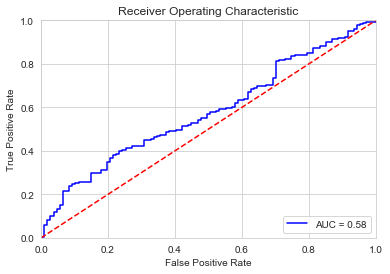

In [172]:
import sklearn.metrics as metrics
# calculate the fpr and tpr for all thresholds of the classification
#predict probabilities
probs = RFCModel1.predict_proba(X_test)
#keep probabilites for the positive outcome only
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc = metrics.auc(fpr, tpr)

# method I: plt
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# Bagging
#Used mostly to reduce the variance in a model

# Extra Trees

>## Fitting Logistic Regression Model And First Evaluation Of The Model

In [176]:
from sklearn import model_selection
from sklearn.ensemble import ExtraTreesClassifier
#Extra Trees Classification
num_trees = 100
ETModel = ExtraTreesClassifier(n_estimators = num_trees, random_state = 1118)
ETModel.fit(X_train, y_train)
#results = cross_val_score(model1, X_train, y_train, cv = kfold)
#print('Extra Trees, Cross-Validation mean: %.4f' % results.mean())


#Accuracies_BagModel = cross_val_score(estimator=BagModel, X=X, y=y, cv=10)
Accuracies_ETModel = cross_val_score(estimator=ETModel, X=X_test, y=y_test, cv=10)

print(Accuracies_ETModel )
print('\n')

Accuracies_ETModel.mean()
print(("Extra Trees, Cross-Validation mean (& Std) after k-Fold CV : %.3f (%.3f)") % (Accuracies_ETModel.mean(), Accuracies_ETModel.std()))


[0.62068966 0.60714286 0.57142857 0.5        0.64285714 0.60714286
 0.57142857 0.51851852 0.62962963 0.59259259]


Extra Trees, Cross-Validation mean (& Std) after k-Fold CV : 0.586 (0.044)


># Hyperparameter Tuning - Extra Trees Model

In [177]:
from sklearn.model_selection import GridSearchCV
Parameters_ETModel = {'n_estimators': range(1,60),
    'criterion' :['gini', 'entropy'],
    'max_depth' : range(1,10,1),
    'max_features': ['auto', 'sqrt', 'log2'],
    }


grid_search = GridSearchCV(estimator = ETModel,
                           param_grid = Parameters_ETModel,
                           scoring = 'accuracy',
                           cv = 10,
                           n_jobs = -1)
grid_search = grid_search.fit(X_train, y_train)
best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_
best_estimator = grid_search.best_estimator_

print("Best accuracy: %.3f "%best_accuracy)
print("-----------------------------")
print("Best parameters are:",best_parameters)
print("-----------------------------")
print("Best estimators are:",best_estimator)

Best accuracy: 0.635 
-----------------------------
Best parameters are: {'criterion': 'gini', 'max_depth': 4, 'max_features': 'auto', 'n_estimators': 4}
-----------------------------
Best estimators are: ExtraTreesClassifier(bootstrap=False, class_weight=None, criterion='gini',
           max_depth=4, max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=4, n_jobs=1,
           oob_score=False, random_state=1118, verbose=0, warm_start=False)


># Retrain Extra Trees Model Using Parameters from Grid Search (Method 1)

In [180]:
ETModel1 = ExtraTreesClassifier(bootstrap=False, class_weight=None, criterion='gini',
           max_depth=4, max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=4, n_jobs=1,
           oob_score=False, random_state=1118, verbose=0, warm_start=False)
ETModel1.fit(X_train, y_train)

y_pred_ETModel1 = ETModel1.predict(X_test)

#Create a classification report for the model
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred_ETModel1))
from sklearn.metrics import precision_score
print("-----------------------------------------------------")
print("Precision score: {}".format(precision_score(y_test,y_pred_ETModel1)))
print('\n')
from sklearn.metrics import recall_score
print("Recall score: {}".format(recall_score(y_test,y_pred_ETModel1)))
print('\n')
from sklearn.metrics import f1_score
print("F1 Score: {}".format(f1_score(y_test,y_pred_ETModel1)))

print('\n')
# Making the New Confusion Matrix based on new parameters for model
from sklearn.metrics import confusion_matrix
Con_Matrix_df = pd.DataFrame(confusion_matrix(y_test,y_pred_ETModel1),
             columns=["Predicted Class " + str(class_name) for class_name in [0,1]],
             index = ["Actual Class " + str(class_name) for class_name in [0,1]])

print(Con_Matrix_df)

             precision    recall  f1-score   support

        0.0       0.39      0.07      0.11       107
        1.0       0.62      0.94      0.74       171

avg / total       0.53      0.60      0.50       278

-----------------------------------------------------
Precision score: 0.6153846153846154


Recall score: 0.935672514619883


F1 Score: 0.7424593967517401


                Predicted Class 0  Predicted Class 1
Actual Class 0                  7                100
Actual Class 1                 11                160


># Applying Extra Trees Model with Grid Search Parameters On k-fold CV Data

In [181]:
Accuracies_ETModel1 = cross_val_score(estimator=ETModel1, X=X_test, y=y_test, cv=10)
print(Accuracies_ETModel1)
print('\n')
Accuracies_ETModel1.mean()
print(("Mean accuracy of model (& Std) after k-Fold CV : %.3f (%.3f)") % (Accuracies_ETModel1.mean(), Accuracies_ETModel1.std()))

[0.62068966 0.67857143 0.67857143 0.60714286 0.64285714 0.60714286
 0.60714286 0.55555556 0.62962963 0.66666667]


Mean accuracy of model (& Std) after k-Fold CV : 0.629 (0.037)


># Plot ROC-AUC Curve 

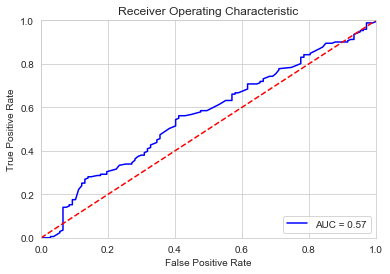

In [183]:
import sklearn.metrics as metrics
# calculate the fpr and tpr for all thresholds of the classification
#predict probabilities
probs = ETModel1.predict_proba(X_test)
#keep probabilites for the positive outcome only
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc = metrics.auc(fpr, tpr)

# method I: plt
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# Boosting

># AdaBoost

In [189]:
from sklearn import model_selection
from sklearn.ensemble import AdaBoostClassifier
#AdaBoost Classification
num_trees = 500
ABModel = AdaBoostClassifier(n_estimators = num_trees, random_state = 1118)
ABModel.fit(X_train, y_train)
#results = cross_val_score(model1, X_train, y_train, cv = kfold)
#print('Bagging, Cross-Validation mean: %.4f' % results.mean())


#Accuracies_BagModel = cross_val_score(estimator=BagModel, X=X, y=y, cv=10)
Accuracies_ABModel = cross_val_score(estimator=ABModel, X=X_test, y=y_test, cv=10)

print(Accuracies_ABModel)
print('\n')

Accuracies_ABModel.mean()
print(("Extra Trees, Cross-Validation mean (& Std) after k-Fold CV : %.3f (%.3f)") % (Accuracies_ABModel.mean(), Accuracies_ABModel.std()))


[0.44827586 0.5        0.64285714 0.57142857 0.75       0.60714286
 0.57142857 0.48148148 0.51851852 0.48148148]


Extra Trees, Cross-Validation mean (& Std) after k-Fold CV : 0.557 (0.087)


># Hyperparameter Tuning - AdaBoost

# Stochastic Gradient Boosting

In [190]:
from sklearn import model_selection
from sklearn.ensemble import GradientBoostingClassifier
#Stochastic Gradient Boosting Classification
num_trees = 500
SGBModel = GradientBoostingClassifier(n_estimators = num_trees, random_state = 1118)
SGBModel.fit(X_train, y_train)
#results = cross_val_score(model1, X_train, y_train, cv = kfold)
#print('Bagging, Cross-Validation mean: %.4f' % results.mean())


#Accuracies_BagModel = cross_val_score(estimator=BagModel, X=X, y=y, cv=10)
Accuracies_SGBModel = cross_val_score(estimator=SGBModel, X=X_test, y=y_test, cv=10)

print(Accuracies_SGBModel)
print('\n')

Accuracies_SGBModel.mean()
print(("Stochastic Gradient Boosting, Cross-Validation mean (& Std) after k-Fold CV : %.3f (%.3f)") % (Accuracies_SGBModel.mean(), Accuracies_SGBModel.std()))

[0.51724138 0.5        0.57142857 0.46428571 0.5        0.60714286
 0.5        0.44444444 0.55555556 0.44444444]


Stochastic Gradient Boosting, Cross-Validation mean (& Std) after k-Fold CV : 0.510 (0.051)


># Hyperparameter Tuning - Stochastic Gradient Boosting

# XGBoost
Ref: https://www.analyticsvidhya.com/blog/2016/03/complete-guide-parameter-tuning-xgboost-with-codes-python/

In [192]:
from xgboost import XGBClassifier

#Stochastic Gradient Boosting Classification
num_trees = 500
XGBModel = XGBClassifier(random_state = 1118)
XGBModel.fit(X_train, y_train)
#results = cross_val_score(model1, X_train, y_train, cv = kfold)
#print('Bagging, Cross-Validation mean: %.4f' % results.mean())


#Accuracies_BagModel = cross_val_score(estimator=BagModel, X=X, y=y, cv=10)
Accuracies_XGBModel = cross_val_score(estimator=XGBModel, X=X_test, y=y_test, cv=10)

print(Accuracies_XGBModel)
print('\n')

Accuracies_XGBModel.mean()
print(("XGBoost, Cross-Validation mean (& Std) after k-Fold CV : %.3f (%.3f)") % (Accuracies_XGBModel.mean(), Accuracies_XGBModel.std()))

[0.65517241 0.42857143 0.46428571 0.5        0.53571429 0.57142857
 0.57142857 0.48148148 0.55555556 0.51851852]


XGBoost, Cross-Validation mean (& Std) after k-Fold CV : 0.528 (0.061)


># Hyperparameter Tuning - XGBoost

>## Grid Search to Find Optimal Parameters

In [ ]:
from sklearn.model_selection import GridSearchCV
Parameters_XGBModel = {'max_depth': [1,2,3,4,5], 
    'subsample': [0.5,1.0],
    'colsample_bytree': [0.5,0.6,0.7,0.8],
    'n_estimators': [10,20,30,40,50],
    'reg_alpha': [0.1,0.2,0.3,0.4]}

In [ ]:
grid_search = GridSearchCV(estimator = XGBModel,
                           param_grid = Parameters_XGBModel,
                           scoring = 'accuracy',
                           cv = 10,
                           n_jobs = -1)
grid_search = grid_search.fit(X_train, y_train)
best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_
best_estimator = grid_search.best_estimator_

print("Best accuracy: %.3f "%best_accuracy)
print("-----------------------------")
print("Best parameters are:",best_parameters)
print("-----------------------------")
print("Best estimators are:",best_estimator)

# Bagging Of The Various Classifiers
Ref: https://medium.com/@rrfd/boosting-bagging-and-stacking-ensemble-methods-with-sklearn-and-mlens-a455c0c982de

In [193]:
# Get some classifiers to evaluate
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import BaggingClassifier, ExtraTreesClassifier, RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

seed = 1118
np.random.seed(seed)

# Base Learners

LRModel_clf=LRModel1
KNNModel_clf=KNNModel1
SVCModel_clf=SVCModel
GNBModel_clf=GNBModel
DTModel_clf=DTModel1
RFCModel_clf=RFCModel1
ETModel_clf=ETModel1


clf_array = [LRModel_clf, KNNModel_clf, SVCModel_clf,GNBModel_clf,DTModel_clf,RFCModel_clf,ETModel_clf]
labels = [clf.__class__.__name__ for clf in clf_array]

normal_accuracy=[]
normal_std = []
bagging_accuracy = []
bagging_std = []

for clf in clf_array:
    cv_scores = cross_val_score(clf, X, y, cv=10, n_jobs=-1)
    bagging_clf = BaggingClassifier(clf, max_samples=0.4, max_features=3, random_state=seed)
    bagging_scores = cross_val_score(bagging_clf, X, y, cv=3, n_jobs=-1)
    
    normal_accuracy.append(np.round(cv_scores.mean(),4))
    normal_std.append(np.round(cv_scores.std(),4))
    
    bagging_accuracy.append(np.round(bagging_scores.mean(),4))
    bagging_std.append(np.round(bagging_scores.std(),4))
    
    print("Accuracy: %0.4f (+/- %0.4f) [Normal %s]" % (cv_scores.mean(), cv_scores.std(), clf.__class__.__name__))
    print("Accuracy: %0.4f (+/- %0.4f) [Bagging %s]\n" % (bagging_scores.mean(), bagging_scores.std(), clf.__class__.__name__))

Accuracy: 0.5944 (+/- 0.0417) [Normal LogisticRegression]
Accuracy: 0.6141 (+/- 0.0006) [Bagging LogisticRegression]

Accuracy: 0.5771 (+/- 0.0440) [Normal KNeighborsClassifier]
Accuracy: 0.6141 (+/- 0.0006) [Bagging KNeighborsClassifier]

Accuracy: 0.6141 (+/- 0.0021) [Normal SVC]
Accuracy: 0.6108 (+/- 0.0022) [Bagging SVC]

Accuracy: 0.5399 (+/- 0.1004) [Normal GaussianNB]
Accuracy: 0.6108 (+/- 0.0032) [Bagging GaussianNB]

Accuracy: 0.5607 (+/- 0.0624) [Normal DecisionTreeClassifier]
Accuracy: 0.6141 (+/- 0.0006) [Bagging DecisionTreeClassifier]

Accuracy: 0.5921 (+/- 0.0583) [Normal RandomForestClassifier]
Accuracy: 0.6141 (+/- 0.0006) [Bagging RandomForestClassifier]

Accuracy: 0.5802 (+/- 0.0566) [Normal ExtraTreesClassifier]
Accuracy: 0.6141 (+/- 0.0006) [Bagging ExtraTreesClassifier]



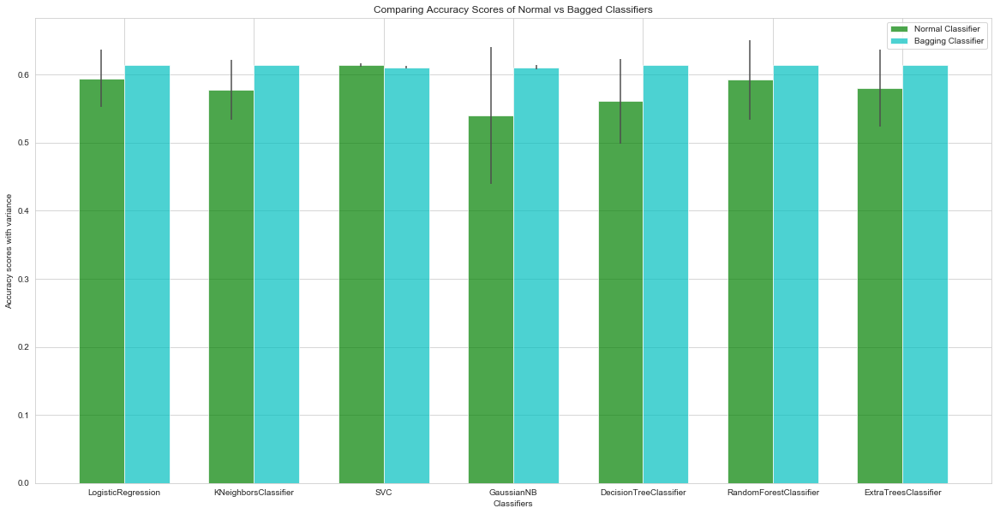

In [194]:
#Graph of Results
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

fig, ax = plt.subplots(figsize=(20,10))
n_groups = 7
index = np.arange(n_groups)
bar_width = 0.35

opacity = .7
error_config = {'ecolor': '0.3'}

normal_clf = ax.bar(index, normal_accuracy, bar_width, alpha=opacity, color='g', yerr=normal_std, error_kw=error_config, label='Normal Classifier')
bagging_clf = ax.bar(index + bar_width, bagging_accuracy, bar_width, alpha=opacity, color='c', yerr=bagging_std, error_kw=error_config, label='Bagging Classifier')

ax.set_xlabel('Classifiers')
ax.set_ylabel('Accuracy scores with variance')
ax.set_title('Comparing Accuracy Scores of Normal vs Bagged Classifiers')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels((labels))
ax.legend()

#fig.tight_layout()

plt.show()

# Our bagged individual classifiers are (mostly better), which one do we choose?  Let's vote!

# Hard Voting

In [197]:
from sklearn.ensemble import VotingClassifier


clf = [LRModel_clf, KNNModel_clf, SVCModel_clf,GNBModel_clf, DTModel_clf,RFCModel_clf,ETModel_clf]
eclf = VotingClassifier(estimators=[('Logistic Regression', LRModel_clf), ('KNNeighbors', KNNModel_clf), ('Support Vector', SVCModel_clf), ('Naive Bayes', GNBModel_clf), ('Decision Trees', DTModel_clf), ('Random Forest', RFCModel_clf), ('Extra Trees', ETModel_clf)], voting='hard')

for clf, label in zip([LRModel_clf, KNNModel_clf, SVCModel_clf, GNBModel_clf, DTModel_clf, RFCModel_clf, ETModel_clf, eclf], ['Logistic Regression','KNNeighbors','Support Vector', 'Naive Bayes','Decision Trees','Random Forest', 'Extra Trees','Ensemble']):
    scores = cross_val_score(clf, X, y, cv=10, scoring='accuracy')
    print("Accuracy: %0.2f (+/- %0.2f) [%s]" % (scores.mean(), scores.std(), label))



Accuracy: 0.59 (+/- 0.04) [Logistic Regression]
Accuracy: 0.58 (+/- 0.04) [KNNeighbors]
Accuracy: 0.61 (+/- 0.00) [Support Vector]
Accuracy: 0.54 (+/- 0.10) [Naive Bayes]
Accuracy: 0.56 (+/- 0.06) [Decision Trees]
Accuracy: 0.59 (+/- 0.06) [Random Forest]
Accuracy: 0.58 (+/- 0.06) [Extra Trees]
Accuracy: 0.59 (+/- 0.05) [Ensemble]


In [ ]:
# #Hard Voting
# from sklearn.ensemble import VotingClassifier

# clf = [rf, et, knn, svc, rg]
# eclf = VotingClassifier(estimators=[('Random Forests', rf), ('Extra Trees', et), ('KNeighbors', knn), ('SVC', svc), ('Ridge Classifier', rg)], voting='hard')

# for clf, label in zip([rf, et, knn, svc, rg, eclf], ['Random Forest', 'Extra Trees', 'KNeighbors', 'SVC', 'Ridge Classifier', 'Ensemble']):
#     scores = cross_val_score(clf, X, y, cv=10, scoring='accuracy')
#     print("Accuracy: %0.2f (+/- %0.2f) [%s]" % (scores.mean(), scores.std(), label))



# Boosting

In [200]:
from sklearn import model_selection
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import VotingClassifier

    

AdaB = AdaBoostClassifier()
GradB = GradientBoostingClassifier()
XGB = XGBClassifier()


boost_array = [AdaB, GradB, XGB]

eclf = VotingClassifier(estimators=[AdaB, GradB, XGB], voting='hard')

labels = ['Ada Boost', 'Grad Boost', 'XG Boost', 'Ensemble']

for clf, label in zip([AdaB, GradB, XGB, eclf], labels):
    scores = cross_val_score(clf, X, y, cv=10, scoring='accuracy')
    print("Mean: {0:.3f}, std: (+/-) {1:.3f} [{2}]".format(scores.mean(), scores.std(), label))



Mean: 0.507, std: (+/-) 0.116 [Ada Boost]
Mean: 0.507, std: (+/-) 0.096 [Grad Boost]
Mean: 0.504, std: (+/-) 0.104 [XG Boost]


AttributeError: 'AdaBoostClassifier' object has no attribute 'estimators_'

# Stacking

In [ ]:
from itertools import combinations
from sklearn.linear_model import LogisticRegression

LR = LogisticRegression()

names = ['Logistic Regression', 'KNNeighbors', 'Support Vector', 'Naive Bayes', 'Decision Tree', 'Random Forest','Extra Trees']
#clf_array = [LRModel_clf, KNNModel_clf, SVCModel_clf,GNBModel_clf, DTModel_clf,RFCModel_clf,ETModel_clf]


def zip_stacked_classifiers(*args):
    to_zip = []
    for arg in args:
        combined_items = sum([map(list, combinations(arg, i)) for i in range(len(arg) + 1)], [])
        combined_items = filter(lambda x: len(x) > 0, combined_items)
        to_zip.append(combined_items)
    
    return zip(to_zip[0], to_zip[1])

stacked_clf_list = zip_stacked_classifiers(clf_array, names)

best_combination = [0.00, ""]

for clf in stacked_clf_list:
    
    ensemble = SuperLearner(scorer = accuracy_score, 
                            random_state = seed, 
                            folds = 10)
    ensemble.add(clf[0])
    ensemble.add_meta(LR)
    ensemble.fit(X_train, y_train)
    preds = ensemble.predict(X_test)
    accuracy = accuracy_score(preds, y_test)
    
    if accuracy > best_combination[0]:
        best_combination[0] = accuracy
        best_combination[1] = clf[1]
    
    print("Accuracy score: {:.3f} {}").format(accuracy, clf[1])

print("\nBest stacking model is {} with accuracy of: {:.3f}").format(best_combination[1], best_combination[0])

# Ensemble
Ref: http://rasbt.github.io/mlxtend/user_guide/classifier/EnsembleVoteClassifier/#example-1-classifying-iris-flowers-using-different-classification-models

In [ ]:
from sklearn import model_selection
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB 
from sklearn.ensemble import RandomForestClassifier
import numpy as np

clf1 = LRModel1
clf2 = RandomForestClassifier(random_state=1118)
clf3 = GaussianNB()

print('5-fold cross validation:\n')

labels = ['Logistic Regression', 'Random Forest', 'Naive Bayes']

for clf, label in zip([clf1, clf2, clf3], labels):

    scores = model_selection.cross_val_score(clf, X, y, 
                                              cv=10, 
                                              scoring='accuracy')
    print("Accuracy: %0.2f (+/- %0.2f) [%s]"
          % (scores.mean(), scores.std(), label))

In [ ]:
from mlxtend.classifier import EnsembleVoteClassifier

eclf = EnsembleVoteClassifier(clfs=[clf1, clf2, clf3], weights=[1,1,1])

labels = ['Logistic Regression', 'Random Forest', 'Naive Bayes', 'Ensemble']
for clf, label in zip([clf1, clf2, clf3, eclf], labels):

    scores = model_selection.cross_val_score(clf, X, y, 
                                              cv=10, 
                                              scoring='accuracy')
    print("Accuracy: %0.2f (+/- %0.2f) [%s]" 
          % (scores.mean(), scores.std(), label))

# Auto-SkLearn
Ref: https://automl.github.io/auto-sklearn/stable/

# Finding Important Features in Scikit-Learn

In [ ]:
import pandas as pd
names=df_new.columns
feature_imp = pd.Series(RFModel.feature_importances_, index=names.drop('TargetVariable')).sort_values(ascending=True)
feature_imp

In [ ]:
# Visualising Important Features
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
# Creating a bar plot
sns.barplot(x=feature_imp, y=feature_imp.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.legend()
plt.show()

# Visualise the Decision Tree

In [ ]:
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydot 



In [ ]:
dot_data = StringIO()  
export_graphviz(DTreeModel, out_file=dot_data,feature_names=X,filled=True,rounded=True)
graph = pydot.graph_from_dot_data(dot_data.getvalue())  
Image(graph[0].create_png())


Answers to Questions Part 1
<a id='Questions'></a>

# Questions
1) Do we include target variable in heatmap?  Criteria for lobbing off variables? >0.5, < 0.5 - those that are 0.8 and above<br>
2) Must we feature scale in Logistic Regression? Which models must we feature scale/standardize variables - 
#so we normalize only the Xes, and for most models, we standardize.<br>
#Standardization - means we bring all our x variables to a z scale, to a z distribution, with mean of 0 and std of 1.  Changing our scale to get a mean of 0 and std dev of 1.  That is using StandardScaler.  Manual calculation is - mean / std deviation
<br>
#Normalization is where we bring to a certain range.
#Also called scaling, bring it for example to a scale of 0 to 7.  The one use is min max scaler in sklearn.  It will 
<br>
#If do by manual
#(X-Xmin)/(Xmax-Xmin)
#Top part, centering distribution around the mean.
#Below is the range of our distribution
#By doing this, we scaling our variables to between 0 and 1 (values will only be between 0 and 1).

#99% of the cases we do standarization

#But in neural networks, we do normalization, convert to normalized scale
#By standardizing we are not changing the nature of the distribution, if it is skewed, it will remain skewed, if there is kurtosis, it will still have kurtosis.

2a) Do we feature scale on Dependent Variable as well? even if DV is 0 vs 1? 
<br>
#Do not feature scale on DV.  Only perform standardization on independent variables.
3) How and where do you apply K-fold cross validation<br>
4) Can x and y stay the same when running all the various models<br>
5) Do we rerun analyses after grid search and report the results based on grid search?
6) for heatmap and corr matrix, do we include the target variable as well? In regression and classification?
7) Is the baseline the same for all classification models or do we calculate a different baseline for each classification model?<br>
#Yes, baseline is the same for the same dataset
8) Use of stratify = y <br>
9) What is the difference between using cross_val_score below and using 'stratify = y' in train test split:
X_train, X_test, y_train, y_test = train_test_split(df_feat, df_new['TargetVariable'], test_size = 0.3, random_state = 1118, stratify=y)<br>
10) Does it mean that we do not have to do train test split if we do from sklearn.model_selection import cross_val_score and specify cv= 5?<br>
10) After grid search, do we run the model again with new parameters and do we generate cross_val_score again?? and compare to baseline?<br>
11) Should we do grid search then cross val score and baseline? and then do comparison?<br>
12) Is it true that Grid Search is not performed for GaussianNB in Naive Bayes Classifier? <br>
12)XG Boost used for? <br>
<br>

#Classification
#How to drop features in classification?
#Use RFECV
#(Recursive Feature Elimination With Cross Validation)
#Input is which model?
#It will take data, put into model, and keep checking by reducing features…..and it will learn out of 100 features, 
#it will learn, 
#It will reduce one feature and check feature, if worse, add back, if not changing or improving, is better![image.png]


<a id='Questions'></a>

# Questions
1) Do we include target variable in heatmap?  Criteria for lobbing off variables? >0.5, < 0.5 <br>
2) Must we feature scale in Logistic Regression? Which models must we feature scale/standardize variables<br>
2a) Do we feature scale on Dependent Variable as well? even if DV is 0 vs 1? <br>
3) How and where do you apply K-fold cross validation<br>
4) Can x and y stay the same when running all the various models<br>
5) Do we rerun analyses after grid search and report the results based on grid search?
6) for heatmap and corr matrix, do we include the target variable as well? In regression and classification?
7) Is the baseline the same for all classification models or do we calculate a different baseline for each classification model?<br>
8) Use of stratify = y <br>
9) What is the difference between using cross_val_score below and using 'stratify = y' in train test split:
X_train, X_test, y_train, y_test = train_test_split(df_feat, df_new['TargetVariable'], test_size = 0.3, random_state = 1118, stratify=y)<br>
10) Does it mean that we do not have to do train test split if we do from sklearn.model_selection import cross_val_score and specify cv= 5?<br>
10) After grid search, do we run the model again with new parameters and do we generate cross_val_score again?? and compare to baseline?<br>
11) Should we do grid search then cross val score and baseline? and then do comparison?<br>
12) Is it true that Grid Search is not performed for GaussianNB in Naive Bayes Classifier? <br>
13)XG Boost used for? <br>

<br>
<br>
14)because cross_val_score is based on X and y and confusion matrix and clasification is based on y_test and y_pred, does it mean that we can only use metrics from one and not the other?


# Stratified K fold with Logistic Regression Ref
https://www.kaggle.com/sudhirnl7/logistic-regression-with-stratifiedkfold/comments


In [201]:
https://www.kaggle.com/c/house-prices-advanced-regression-techniques
    Check out the Ames Housing Dataset

SyntaxError: invalid syntax (<ipython-input-201-f2330ec080e4>, line 1)

<a id='Regression'></a>
#    Regression

In [63]:
#Define features for Regression
df_regress = df.loc[:,['PCI_Total','RosenbergSES_Total', 'Rumination_Total','PSWQ_Total', 'PRCScaleTotal', 'DASS21_Total']]

In [64]:
#Defining the feature set (X1) and target variable (y1) for regression
#Include 6 features:
X1=df_regress.iloc[:,0:5] 
y1=df_regress.iloc[:,5]

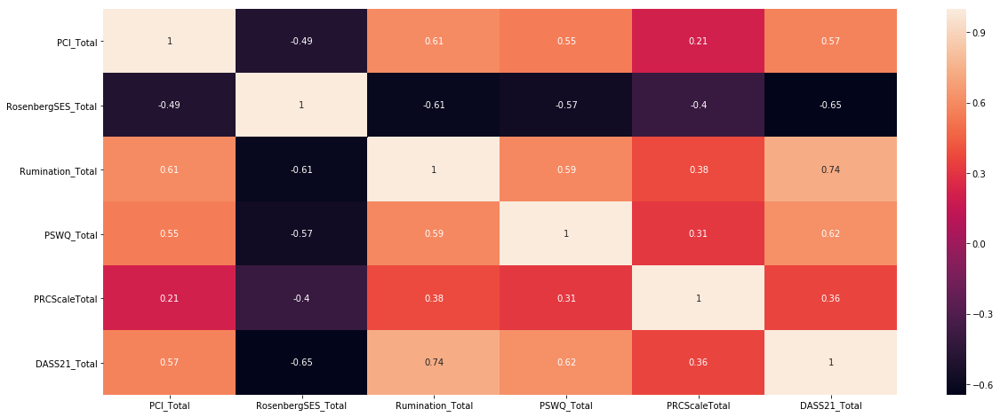

In [67]:
#sns.heatmap((df_new.iloc[:, [0,1,2,3,4,5]]).corr(), annot=True) same as
plt.figure(figsize=(20,8))
sns.heatmap((df_regress.iloc[:, 0:6]).corr(), annot=True)

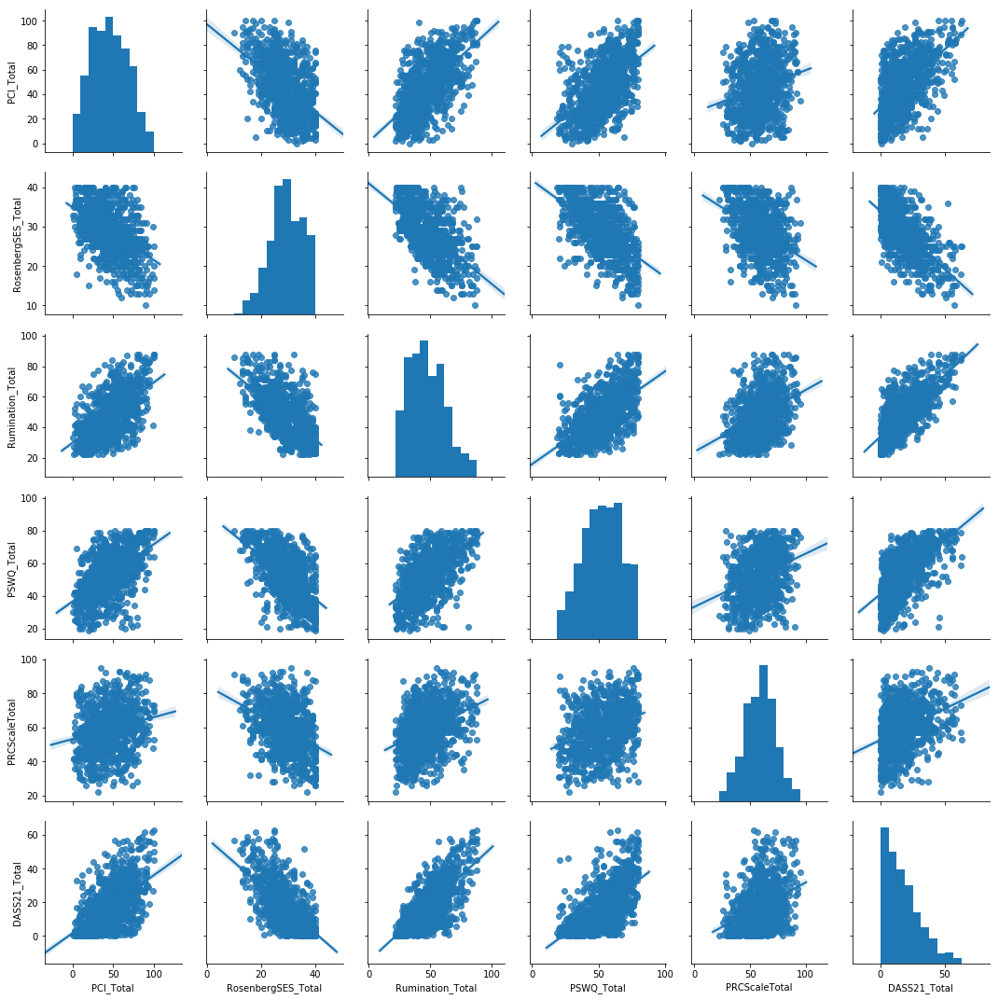

In [68]:
sns.pairplot(df_regress, kind='reg')

DASS21_Total Skewness: 0.94
DASS21_Total Kurtosis: 0.44


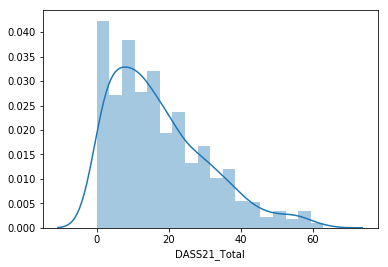

In [80]:
#Distribution of the Target Variable
sns.distplot(df_regress['DASS21_Total'])
print('DASS21_Total Skewness: %0.2f'%df_regress['DASS21_Total'].skew())
print('DASS21_Total Kurtosis: %0.2f'%df_regress['DASS21_Total'].kurtosis())

# Multiple Linear Regression

## Standardize_the_Features and Target Variable
Ref: https://stats.stackexchange.com/questions/111467/is-it-necessary-to-scale-the-target-value-in-addition-to-scaling-features-for-re

In [81]:
#Fit the scaler to our data but NOT including the TARGET class "TargetVariable"

#First, import StandardScaler from Scikit learn 
from sklearn.preprocessing import StandardScaler
#Create an instance of a StandardScaler() object called Sc
Sc = StandardScaler()
#Fit Sc to the features:
Sc.fit(df_regress)

#Use the .transform() method to transform the features to a scaled version:
scaled_features = Sc.transform(df_regress)
scaled_features

# #Convert the scaled features to a dataframe and check that the scaling worked.
# df_ScaledFeatures = pd.DataFrame(scaled_features, columns=df_new.columns[:-1])
# df_ScaledFeatures.head()

array([[ 1.18311997,  0.02230572, -0.66621768,  0.31055326,  0.58628081,
        -0.99453314],
       [-1.36196369,  1.80939821, -1.55527191, -2.00720671, -0.94546159,
        -1.14362044],
       [-0.42430129, -0.14015723, -1.0765504 , -1.72626611, -0.28900056,
        -0.6218149 ],
       ...,
       [ 1.9868306 , -2.25217562,  2.41127771,  1.43431567,  0.73216104,
         1.53995088],
       [ 2.4333365 , -1.92724972,  2.75322165,  1.92596172,  0.80510115,
         2.06175642],
       [ 1.13846938, -1.2773979 ,  0.83833562,  0.94266962, -0.07018022,
         1.31631994]])

In [170]:

df_ScaledFeatures=pd.DataFrame(scaled_features, columns=df_regress.columns)
X1=df_ScaledFeatures.iloc[:,0:5] 
y1=df_regress.iloc[:,5]


X2=df_ScaledFeatures[['RosenbergSES_Total','Rumination_Total','PSWQ_Total']]


,PCI_Total,RosenbergSES_Total,Rumination_Total,PSWQ_Total,PRCScaleTotal
0,1.183120,0.022306,-0.666218,0.310553,0.586281
1,-1.361964,1.809398,-1.555272,-2.007207,-0.945462
2,-0.424301,-0.140157,-1.076550,-1.726266,-0.289001
3,0.870566,1.322009,-1.076550,-1.585796,-0.799581
4,0.468711,-0.465083,0.496392,-1.375090,0.148640
5,-0.826157,1.159546,-0.529440,-1.234620,-1.237222
6,-1.808470,0.022306,-0.529440,-1.023915,1.461562
7,-0.156398,-1.277398,0.906724,-0.602504,1.972143
8,0.915216,-0.627546,-0.666218,-0.321563,-1.601923
9,0.825915,0.509695,-0.255885,-0.321563,-0.289001


In [111]:
# # sns.pairplot(df_ScaledFeatures kind='reg')

# sns.pairplot(data=df_regress,x_vars=X1, y_vars=y1,kind='reg', palette='deep')

## Train Test Split 

In [112]:
# Splitting the raw dataset into training set and testing set using train_test_split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size = 0.3, random_state = 1118)

In [141]:
print(X_train)
print('\n')
print(np.array(X_train))


     PCI_Total  RosenbergSES_Total  Rumination_Total  PSWQ_Total  \
660   0.825915           -0.952472          0.701558    0.731964   
557   0.781265           -0.627546          0.769947   -0.110858   
896  -0.826157            0.347232          0.906724   -1.094150   
684   0.959867           -1.277398         -0.119107    0.521259   
837   0.602662           -0.952472         -0.461051    0.029613   
417  -1.361964            0.997083         -0.324274    0.942670   
308  -1.406614            1.809398         -1.623661   -2.147677   
165  -1.272663            0.834620         -1.008162   -0.672739   
87   -1.674518            0.022306         -1.486883   -1.726266   
564   1.897529            0.347232          1.385446    1.012905   
378  -1.272663            0.184769         -0.529440    0.029613   
411   0.915216            0.022306          0.291225    0.731964   
193  -1.049410            0.997083         -0.324274   -1.304855   
414  -0.201048           -0.952472         -0.05

## Scoring Model
A common method of measuring the accuracy of regression models is to use the R2

statistic.

The R2

statistic is defined as follows:

R2=1–RSSTSS

    The RSS (Residual sum of squares) measures the variability left unexplained after performing the regression
    The TSS measues the total variance in Y
    Therefore the R2

    statistic measures proportion of variability in Y that is explained by X using our model

R2
can be determined using our test set and the model’s score method.

# Model Fit with Statsmodel

In [130]:
# Splitting the raw dataset into training set and testing set using train_test_split
from sklearn.model_selection import train_test_split
X_train, X_test,y_train, y_test = train_test_split(X1, y1, test_size = 0.3, random_state = 1118)



In [131]:
import statsmodels.api as sm

In [132]:
#Adding intercept into the model:
X_train1 = sm.add_constant(X_train)


In [133]:
print(type(X_train))

<class 'pandas.core.frame.DataFrame'>


In [164]:
#Fit the OLS Model in Statsmodel:
model = sm.OLS(np.array(y_train), np.array(X_train)).fit()

In [165]:
print(model.params)

[ 0.61623365 -2.76526915  5.5382094   2.58254319  0.92186936]


In [166]:
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.211
Model:                            OLS   Adj. R-squared:                  0.205
Method:                 Least Squares   F-statistic:                     34.36
Date:                Thu, 25 Apr 2019   Prob (F-statistic):           3.76e-31
Time:                        23:21:16   Log-Likelihood:                -2835.5
No. Observations:                 647   AIC:                             5681.
Df Residuals:                     642   BIC:                             5703.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1             0.6162      1.015      0.607      0.5

In [171]:
#New train test split
X_train, X_test, y_train, y_test = train_test_split(X2, y1, test_size = 0.3, random_state = 1118)

In [ ]:
#Adding intercept into the model:
X_train2 = sm.add_constant(X_train)

In [173]:
#Fit the OLS Model in Statsmodel:
model = sm.OLS(np.array(y_train), np.array(X_train)).fit()

In [174]:
print(model.params)

[-3.03229089  5.95157926  2.81828445]


In [175]:
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.209
Model:                            OLS   Adj. R-squared:                  0.206
Method:                 Least Squares   F-statistic:                     56.86
Date:                Thu, 25 Apr 2019   Prob (F-statistic):           1.28e-32
Time:                        23:25:47   Log-Likelihood:                -2836.2
No. Observations:                 647   AIC:                             5678.
Df Residuals:                     644   BIC:                             5692.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1            -3.0323      1.054     -2.878      0.0

In [ ]:
See https://stackoverflow.com/questions/54614157/scikit-learn-statsmodels-which-r-squared-is-correct

In [180]:
from sklearn.linear_model import LinearRegression
LRModel=LinearRegression(fit_intercept=True)

LRModel.fit(X_train, y_train) 
#LRModel.score(X_test,y_test)
r2Score=metrics.r2_score(y_train, LRModel.predict(X_train))
print(r2Score)

0.624974229550898


In our model, 63% of the variability in Y can be explained using X

##  Fitting Multiple Regression Model And First Evaluation Of The Model

In [181]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn import metrics
from sklearn.model_selection import GridSearchCV
LRModel=LinearRegression()

LRModel.fit(X_train, y_train) 
Scores_LRModel = cross_val_score(estimator=LRModel, X=X_train, y=y_train, cv=10) 


print('\n')
Scores_LRModel.mean()
print(("Mean accuracy of model (& Std) after k-Fold CV : %.3f (%.3f)") % (Scores_LRModel.mean(), Scores_LRModel.std()))



Mean accuracy of model (& Std) after k-Fold CV : 0.597 (0.075)


In [182]:
#To get predictions (y_hat) and check them all in one using cross validation
#y_test is needed here in predictions to get scores for each fold of cv
Predictions_LRModel=cross_val_predict(estimator=LRModel, X=X_test, y=y_test, cv=10) 

Predictions_LRModel.mean()
print(("Mean accuracy of model (& Std) after k-Fold CV : %.3f (%.3f)") % (Predictions_LRModel.mean(), Predictions_LRModel.std()))

Mean accuracy of model (& Std) after k-Fold CV : 17.155 (11.232)


In [184]:
#accuracy of the predictions from the best cv fold
r2 = metrics.r2_score(y_test, Predictions_LRModel) 
print("R2 Score: %0.3f"%r2)

#Formula for adjusted R2
#Adj r2 = 1-(1-R2)*(n-1)/(n-p-1)
#n = number of sample size , p = number of independent variables 
n=len(X_train)
p=5
r2_adjusted=1- (1-r2)*(n-1)/(n-p-1)
print("R2 Adjusted Score: %0.3f"%r2_adjusted)

R2 Score: 0.633
R2 Adjusted Score: 0.630


## Creating and Training the Linear Regression Model

In [102]:
LRModel.fit(X_train,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [103]:
# print the y intercept
print(LRModel.intercept_)

17.68673210255552


In [104]:
#Coefficients of each feature in the dataset
LRModel.coef_

array([ 1.45687653, -3.19832123,  5.65547403,  2.04897055,  0.45583328])

In [105]:
#Show the coefficients for each feature
coeff_df = pd.DataFrame(LRModel.coef_,X1.columns,columns=['Coefficient'])
coeff_df

,Coefficient
PCI_Total,1.456877
RosenbergSES_Total,-3.198321
Rumination_Total,5.655474
PSWQ_Total,2.048971
PRCScaleTotal,0.455833


# Predictions from the Multiple Linear Regression Model

In [106]:
#Score to see how good a fit the model is
LRModel.score(X_test,y_test)

0.6378316493785027

In [107]:
y_pred = LRModel.predict(X_test)

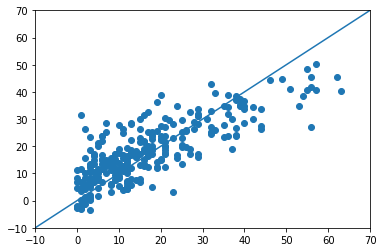

In [122]:
#Scatterplot comparing y_test with predictions - if output is lined up like this ==> pretty good job
plt.scatter(y_test,y_pred)
plt.xlim([-10,70])
plt.ylim([-10,70])
plt.plot([-10,70],[-10,70])
plt.show()


# Plot Residual Histogram

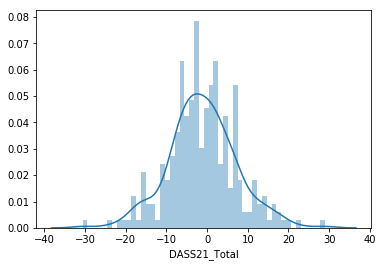

In [123]:
#Create histogram of the distribution of our residuals
#If we have a normal distribution for the residuals, it means our model was a correct choice for the data.

sns.distplot((y_test-y_pred),bins=50);

# Regression Evaluation Metrics

In [118]:
import sklearn.metrics as metrics


print('Mean Absolute Error:%.2f ' %  metrics.mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:%.2f ' %  metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:%.2f ' %  np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print('\n')
# Explained variance score: 1 is perfect prediction
#R^2 (coefficient of determination) regression score function.
print('Variance score: %.2f' % metrics.r2_score(y_test, y_pred))

print('Explained variance regression score:%.2f' %  metrics.explained_variance_score(y_test, y_pred))

Mean Absolute Error:6.51 
Mean Squared Error:71.86 
Root Mean Squared Error:8.48 


Variance score: 0.64
Explained variance regression score:0.64


# Ridge Regression
A ridge regression penalises large weights and helps us avoid overfitting to outliers

##  Fitting Ridge Regression Model And First Evaluation Of The Model

In [127]:
from sklearn.linear_model import Ridge
RRModel=Ridge()

RRModel.fit(X_train, y_train) 
Scores_RRModel = cross_val_score(estimator=RRModel, X=X_train, y=y_train, cv=10) 

print('\n')
Scores_RRModel.mean()
print(("Mean accuracy of model (& Std) after k-Fold CV : %.3f (%.3f)") % (Scores_RRModel.mean(), Scores_RRModel.std()))



Mean accuracy of model (& Std) after k-Fold CV : 0.601 (0.084)


In [128]:
#To get predictions (y_hat) and check them all in one using cross validation
#y_test is needed here in predictions to get scores for each fold of cv
Predictions_RRModel=cross_val_predict(estimator=RRModel, X=X_test, y=y_test, cv=10) 

Predictions_RRModel.mean()
print(("Mean accuracy of model (& Std) after k-Fold CV : %.3f (%.3f)") % (Predictions_RRModel.mean(), Predictions_RRModel.std()))

Mean accuracy of model (& Std) after k-Fold CV : 17.178 (11.312)


In [129]:
#accuracy of the predictions from the best cv fold
accuracy = metrics.r2_score(y_test, Predictions_RRModel) 
print(accuracy)

0.6300889717332304


## Hyperparameter Tuning - Ridge Regression Model

In [90]:
#Determine alpha for the model using grid search
from sklearn.linear_model import Ridge
RRModel=Ridge()
RRModel
#Original Alphas:
#{'alpha': [100000, 10000, 1000, 100, 1,0.1,0.01,0.001,0.0001, 0.00001, 0.000001]
Parameters_RRModel ={'alpha': range(0,1000,10),
                     'fit_intercept': [True,False],
                     'normalize' :[False, True]}
grid_search = GridSearchCV(estimator = RRModel,
                           param_grid = Parameters_RRModel,
                           cv = 10,
                           n_jobs = -1)
grid_search = grid_search.fit(X_train, y_train)
best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_
best_estimator = grid_search.best_estimator_

print("Best accuracy: %.3f "%best_accuracy)
print("-----------------------------")
print("Best parameters are:",best_parameters)
print("-----------------------------")
print("Best estimators are:",best_estimator)

                    

Best accuracy: 0.603 
-----------------------------
Best parameters are: {'alpha': 40, 'fit_intercept': True, 'normalize': False}
-----------------------------
Best estimators are: Ridge(alpha=40, copy_X=True, fit_intercept=True, max_iter=None,
   normalize=False, random_state=None, solver='auto', tol=0.001)


## Retrain Ridge Regression Model Using Parameters from Grid Search

In [130]:
RRModel1 = Ridge(alpha=40, copy_X=True, fit_intercept=True, max_iter=None,
   normalize=False, random_state=None, solver='auto', tol=0.001)

RRModel1.fit(X_train, y_train)



Ridge(alpha=40, copy_X=True, fit_intercept=True, max_iter=None,
   normalize=False, random_state=None, solver='auto', tol=0.001)

In [131]:
# print the y intercept
print(RRModel1.intercept_)

17.67996955535893


In [132]:
#Coefficients of each feature in the dataset
RRModel1.coef_

array([ 1.59662182, -3.13453622,  5.21606888,  2.08730616,  0.57601625])

In [133]:
#Show the coefficients for each feature
coeff_df = pd.DataFrame(RRModel1.coef_,X1.columns,columns=['Coefficient'])
coeff_df

,Coefficient
PCI_Total,1.596622
RosenbergSES_Total,-3.134536
Rumination_Total,5.216069
PSWQ_Total,2.087306
PRCScaleTotal,0.576016


## Predictions from the Ridge Regression Model

In [134]:
#Score to see how good a fit the model is
RRModel1.score(X_test,y_test)

0.6376381250495246

In [135]:
y_pred_RRModel1 = RRModel1.predict(X_test)

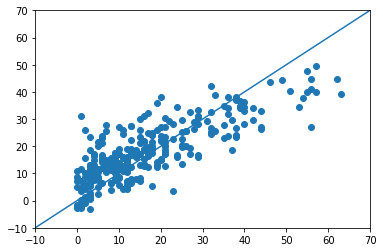

In [136]:
#Scatterplot comparing y_test with predictions - if output is lined up  ==> pretty good job
plt.scatter(y_test,y_pred_RRModel1)
plt.xlim([-10,70])
plt.ylim([-10,70])
plt.plot([-10,70],[-10,70])
plt.show()


## Plot Residual Histogram

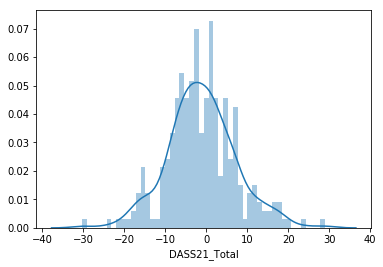

In [137]:
#Create histogram of the distribution of our residuals
#If we have a normal distribution for the residuals, it means our model was a correct choice for the data.

sns.distplot((y_test-y_pred_RRModel1),bins=50);

## Regression Evaluation Metrics

In [138]:
import sklearn.metrics as metrics


print('Mean Absolute Error:%.2f ' %  metrics.mean_absolute_error(y_test, y_pred_RRModel1))
print('Mean Squared Error:%.2f ' %  metrics.mean_squared_error(y_test, y_pred_RRModel1))
print('Root Mean Squared Error:%.2f ' %  np.sqrt(metrics.mean_squared_error(y_test, y_pred_RRModel1)))
print('\n')
# Explained variance score: 1 is perfect prediction
#R^2 (coefficient of determination) regression score function.
print('Variance score: %.2f' % metrics.r2_score(y_test, y_pred_RRModel1))

print('Explained variance regression score:%.2f' %  metrics.explained_variance_score(y_test, y_pred_RRModel1))

Mean Absolute Error:6.51 
Mean Squared Error:71.90 
Root Mean Squared Error:8.48 


Variance score: 0.64
Explained variance regression score:0.64


# Lasso Regression

##  Fitting Multiple Regression Model And First Evaluation Of The Model

In [139]:
from sklearn.linear_model import Lasso
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
LModel=Lasso()

LModel.fit(X_train, y_train) 
Scores_LModel = cross_val_score(estimator=LModel, X=X_train, y=y_train, cv=10) 

print('\n')
Scores_LModel.mean()
print(("Mean accuracy of model (& Std) after k-Fold CV : %.3f (%.3f)") % (Scores_LModel.mean(), Scores_LModel.std()))



Mean accuracy of model (& Std) after k-Fold CV : 0.596 (0.063)


In [140]:
#To get predictions (y_hat) and check them all in one using cross validation
#y_test is needed here in predictions to get scores for each fold of cv
Predictions_LModel=cross_val_predict(estimator=LModel, X=X_test, y=y_test, cv=10) 

Predictions_LModel.mean()
print(("Mean accuracy of model (& Std) after k-Fold CV : %.3f (%.3f)") % (Predictions_LModel.mean(), Predictions_LModel.std()))

Mean accuracy of model (& Std) after k-Fold CV : 17.161 (10.167)


In [141]:
#accuracy of the predictions from the best cv fold
accuracy = metrics.r2_score(y_test, Predictions_LModel) 
print(accuracy)

0.6241019361020599


## Hyperparameter Tuning - Lasso Regression Model

In [103]:
LModel=Lasso()
LModel
#Original Alphas:
#{'alpha': [100000, 10000, 1000, 100, 1,0.1,0.01,0.001,0.0001, 0.00001, 0.000001]
Parameters_LModel ={'alpha': range(0,1),
                     'fit_intercept': [True,False],
                     'normalize' :[False, True]}
grid_search = GridSearchCV(estimator = LModel,
                           param_grid = Parameters_LModel,
                           cv = 10,
                           n_jobs = -1)
grid_search = grid_search.fit(X_train, y_train)
best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_
best_estimator = grid_search.best_estimator_

print("Best accuracy: %.3f "%best_accuracy)
print("-----------------------------")
print("Best parameters are:",best_parameters)
print("-----------------------------")
print("Best estimators are:",best_estimator)

Best accuracy: 0.601 
-----------------------------
Best parameters are: {'alpha': 0, 'fit_intercept': True, 'normalize': False}
-----------------------------
Best estimators are: Lasso(alpha=0, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False)


## Retrain Lasso Regression Model Using Parameters from Grid Search 

In [142]:
LModel1 = Lasso(alpha=0, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False)
LModel1.fit(X_train, y_train)

y_pred_LModel1 = LModel1.predict(X_test)

In [143]:
# print the y intercept
print(LModel1.intercept_)

17.68673210255552


In [144]:
#Coefficients of each feature in the dataset
LModel1.coef_

array([ 1.45687653, -3.19832123,  5.65547403,  2.04897055,  0.45583328])

In [145]:
#Show the coefficients for each feature
coeff_df = pd.DataFrame(LModel1.coef_,X1.columns,columns=['Coefficient'])
coeff_df

,Coefficient
PCI_Total,1.456877
RosenbergSES_Total,-3.198321
Rumination_Total,5.655474
PSWQ_Total,2.048971
PRCScaleTotal,0.455833


## Predictions from the Lasso  Regression Model

In [146]:
#Score to see how good a fit the model is
LModel1.score(X_test,y_test)

0.6378316493785027

In [147]:
y_pred_LModel1 = LModel1.predict(X_test)


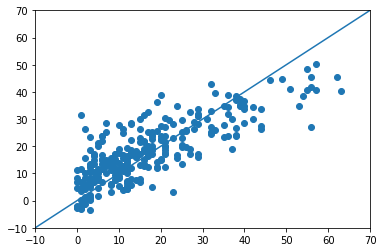

In [148]:
#Scatterplot comparing y_test with predictions - if output is lined up like this ==> pretty good job
plt.scatter(y_test,y_pred_LModel1)
plt.xlim([-10,70])
plt.ylim([-10,70])
plt.plot([-10,70],[-10,70])
plt.show()

## Plot Residual Histogram

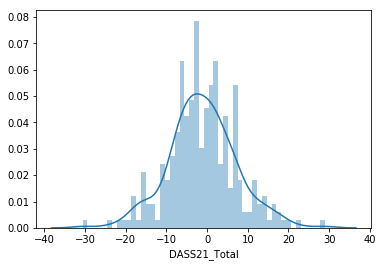

In [149]:
#Create histogram of the distribution of our residuals
#If we have a normal distribution for the residuals, it means our model was a correct choice for the data.

sns.distplot((y_test-y_pred_LModel1),bins=50);

## Regression Evaluation Metrics

In [150]:
import sklearn.metrics as metrics


print('Mean Absolute Error:%.2f ' %  metrics.mean_absolute_error(y_test, y_pred_LModel1))
print('Mean Squared Error:%.2f ' %  metrics.mean_squared_error(y_test, y_pred_LModel1))
print('Root Mean Squared Error:%.2f ' %  np.sqrt(metrics.mean_squared_error(y_test, y_pred_LModel1)))
print('\n')
# Explained variance score: 1 is perfect prediction
#R^2 (coefficient of determination) regression score function.
print('Variance score: %.2f' % metrics.r2_score(y_test, y_pred_LModel1))

print('Explained variance regression score:%.2f' %  metrics.explained_variance_score(y_test, y_pred_LModel1))

Mean Absolute Error:6.51 
Mean Squared Error:71.86 
Root Mean Squared Error:8.48 


Variance score: 0.64
Explained variance regression score:0.64


## Elastic Net Regresssion
Elastic Net combines the Ridge and Lasso regularization penalties

##  Fitting the Elastic Net Regression Model And First Evaluation Of The Model

In [151]:
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
ENModel=ElasticNet()

ENModel.fit(X_train, y_train) 
Scores_ENModel = cross_val_score(estimator=ENModel, X=X_train, y=y_train, cv=10) 

print('\n')
Scores_ENModel.mean()
print(("Mean accuracy of model (& Std) after k-Fold CV : %.3f (%.3f)") % (Scores_ENModel.mean(), Scores_ENModel.std()))



Mean accuracy of model (& Std) after k-Fold CV : 0.578 (0.052)


In [152]:
#To get predictions (y_hat) and check them all in one using cross validation
#y_test is needed here in predictions to get scores for each fold of cv
Predictions_ENModel=cross_val_predict(estimator=ENModel, X=X_test, y=y_test, cv=10) 

Predictions_ENModel.mean()
print(("Mean accuracy of model (& Std) after k-Fold CV : %.3f (%.3f)") % (Predictions_ENModel.mean(), Predictions_ENModel.std()))

Mean accuracy of model (& Std) after k-Fold CV : 17.165 (9.179)


In [153]:
#accuracy of the predictions from the best cv fold
accuracy = metrics.r2_score(y_test, Predictions_ENModel) 
print(accuracy)

0.6112194360201301


## Hyperparameter Tuning - Elastic Net Regression Model

In [124]:
#Determine alpha for the model using grid search

ENModel=ElasticNet()
ENModel
#Original Alphas:
#{'alpha': [100000, 10000, 1000, 100, 1,0.1,0.01,0.001,0.0001, 0.00001, 0.000001]
Parameters_ENModel ={'alpha': [0.001,0.01, 0.02,0.03,0.04,0.1,0.2,0.3],
                     'fit_intercept': [True,False],
                     'normalize' :[False, True]}
grid_search = GridSearchCV(estimator = ENModel,
                           param_grid = Parameters_ENModel,
                           cv = 10,
                           n_jobs = -1)
grid_search = grid_search.fit(X_train, y_train)
best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_
best_estimator = grid_search.best_estimator_

print("Best accuracy: %.3f "%best_accuracy)
print("-----------------------------")
print("Best parameters are:",best_parameters)
print("-----------------------------")
print("Best estimators are:",best_estimator)

Best accuracy: 0.603 
-----------------------------
Best parameters are: {'alpha': 0.1, 'fit_intercept': True, 'normalize': False}
-----------------------------
Best estimators are: ElasticNet(alpha=0.1, copy_X=True, fit_intercept=True, l1_ratio=0.5,
      max_iter=1000, normalize=False, positive=False, precompute=False,
      random_state=None, selection='cyclic', tol=0.0001, warm_start=False)


## Retrain Elastic Net Regression Model Using Parameters from Grid Search

In [154]:
ENModel1 = ElasticNet(alpha=0.03, copy_X=True, fit_intercept=False, l1_ratio=0.5,
      max_iter=1000, normalize=False, positive=False, precompute=False,
      random_state=None, selection='cyclic', tol=0.0001, warm_start=False)


ENModel1.fit(X_train, y_train)

y_pred_ENModel1 = ENModel1.predict(X_test)

In [155]:
# print the y intercept
print(ENModel1.intercept_)

0.0


In [156]:
#Coefficients of each feature in the dataset
ENModel1.coef_

array([ 0.6706576 , -2.76056287,  5.415935  ,  2.56476287,  0.93567709])

In [157]:
#Show the coefficients for each feature
coeff_df = pd.DataFrame(ENModel1.coef_,X1.columns,columns=['Coefficient'])
coeff_df

,Coefficient
PCI_Total,0.670658
RosenbergSES_Total,-2.760563
Rumination_Total,5.415935
PSWQ_Total,2.564763
PRCScaleTotal,0.935677


## Predictions from the Elastic Net Regression Model

In [158]:
#Score to see how good a fit the model is
ENModel1.score(X_test,y_test)

-0.7574744596978527

In [159]:
y_pred_ENModel1 = ENModel1.predict(X_test)

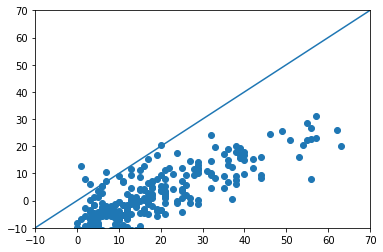

In [160]:
#Scatterplot comparing y_test with predictions - if output is lined up like this ==> pretty good job
plt.scatter(y_test,y_pred_ENModel1)
plt.xlim([-10,70])
plt.ylim([-10,70])
plt.plot([-10,70],[-10,70])
plt.show()

## Plot Residual Histogram

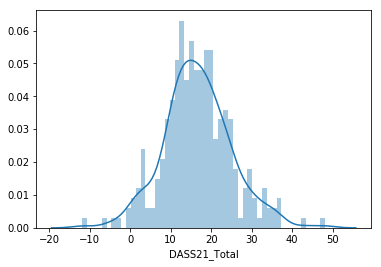

In [161]:
#Create histogram of the distribution of our residuals
#If we have a normal distribution for the residuals, it means our model was a correct choice for the data.

sns.distplot((y_test-y_pred_ENModel1),bins=50);

## Regression Evaluation Metrics

In [162]:
import sklearn.metrics as metrics


print('Mean Absolute Error:%.2f ' %  metrics.mean_absolute_error(y_test, y_pred_ENModel1))
print('Mean Squared Error:%.2f ' %  metrics.mean_squared_error(y_test, y_pred_ENModel1))
print('Root Mean Squared Error:%.2f ' %  np.sqrt(metrics.mean_squared_error(y_test, y_pred_ENModel1)))
print('\n')
# Explained variance score: 1 is perfect prediction
#R^2 (coefficient of determination) regression score function.
print('Variance score: %.2f' % metrics.r2_score(y_test, y_pred_ENModel1))

print('Explained variance regression score:%.2f' %  metrics.explained_variance_score(y_test, y_pred_ENModel1))

Mean Absolute Error:16.84 
Mean Squared Error:348.73 
Root Mean Squared Error:18.67 


Variance score: -0.76
Explained variance regression score:0.64


# Recursive Feature Elimination
We can also do a recursive feature elimination in the feature_selection part of sklearn to cut down on the variables that are just adding noise to the model.

In [167]:
from sklearn.feature_selection import RFE
from sklearn.svm import SVR

estimator = SVR(kernel="linear")
selector = RFE(estimator, 10, step=1)
selector = selector.fit(X_train, y_train)

In [168]:
selector_output = pd.DataFrame(data=selector.ranking_, index=X1.columns.values, columns=[['Ranking']])
selector_output['Support'] = selector.support_
selector_output['Ranking'] = selector.ranking_
selector_output.transpose()

,PCI_Total,RosenbergSES_Total,Rumination_Total,PSWQ_Total,PRCScaleTotal
Ranking,1,1,1,1,1
Support,True,True,True,True,True


In [169]:
from sklearn.feature_selection import RFECV
from sklearn.svm import SVR

estimator = SVR(kernel="linear")
selector = RFECV(estimator, step=1, cv=10)
selector = selector.fit(X_train, y_train)


In [170]:
selector_output = pd.DataFrame(data=selector.ranking_, index=X1.columns.values, columns=[['Ranking']])
selector_output['Support'] = selector.support_
selector_output['Ranking'] = selector.ranking_
selector_output.transpose()

,PCI_Total,RosenbergSES_Total,Rumination_Total,PSWQ_Total,PRCScaleTotal
Ranking,1,1,1,1,1
Support,True,True,True,True,True


# Random Forest Regression
Ref: https://medium.com/datadriveninvestor/random-forest-regression-9871bc9a25eb

##  Fitting Random Forest Regression Model And First Evaluation Of The Model

In [171]:
from sklearn.ensemble import RandomForestRegressor

RFModel=RandomForestRegressor()

RFModel.fit(X_train, y_train) 
Scores_RFModel = cross_val_score(estimator=RFModel, X=X_train, y=y_train, cv=10) 

print('\n')
Scores_RFModel.mean()
print(("Mean accuracy of model (& Std) after k-Fold CV : %.3f (%.3f)") % (Scores_RFModel.mean(), Scores_RFModel.std()))



Mean accuracy of model (& Std) after k-Fold CV : 0.553 (0.107)


In [172]:
#To get predictions (y_hat) and check them all in one using cross validation
#y_test is needed here in predictions to get scores for each fold of cv
Predictions_RFModel=cross_val_predict(estimator=RFModel, X=X_test, y=y_test, cv=10) 

Predictions_RFModel.mean()
print(("Mean accuracy of model (& Std) after k-Fold CV : %.3f (%.3f)") % (Predictions_LRModel.mean(), Predictions_LRModel.std()))

Mean accuracy of model (& Std) after k-Fold CV : 17.178 (11.329)


In [173]:
#accuracy of the predictions from the best cv fold
accuracy = metrics.r2_score(y_test, Predictions_RFModel) 
print(accuracy)

0.5739947543982826


## Hyperparameter Tuning - Random Forest Regressor Model

In [174]:

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

RFModel=RandomForestRegressor(random_state=1118)

#Original Alphas:
#{'alpha': [100000, 10000, 1000, 100, 1,0.1,0.01,0.001,0.0001, 0.00001, 0.000001]
Parameters_RFModel = {"n_estimators": [200, 500],
    "max_depth": [3, None],
    "max_features": [1, 3, 5],
    "min_samples_split": [10,15,20],
    "min_samples_leaf": [1, 3, 10],
    "bootstrap": [True, False]}


grid_search = GridSearchCV(estimator = RFModel,
                           param_grid = Parameters_RFModel,
                           cv = 10,
                           n_jobs = -1)

grid_search = grid_search.fit(X_train, y_train)
best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_
best_estimator = grid_search.best_estimator_

print("Best accuracy: %.3f "%best_accuracy)
print("-----------------------------")
print("Best parameters are:",best_parameters)
print("-----------------------------")
print("Best estimators are:",best_estimator)

Best accuracy: 0.615 
-----------------------------
Best parameters are: {'bootstrap': True, 'max_depth': None, 'max_features': 3, 'min_samples_leaf': 3, 'min_samples_split': 20, 'n_estimators': 500}
-----------------------------
Best estimators are: RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features=3, max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=3,
           min_samples_split=20, min_weight_fraction_leaf=0.0,
           n_estimators=500, n_jobs=1, oob_score=False, random_state=1118,
           verbose=0, warm_start=False)


## Retrain Random Forest Regression Model Using Parameters from Grid Search 

In [175]:
RFModel1 = RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features=3, max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=3,
           min_samples_split=20, min_weight_fraction_leaf=0.0,
           n_estimators=500, n_jobs=1, oob_score=False, random_state=1118,
           verbose=0, warm_start=False)
RFModel1.fit(X_train, y_train)



RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features=3, max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=3,
           min_samples_split=20, min_weight_fraction_leaf=0.0,
           n_estimators=500, n_jobs=1, oob_score=False, random_state=1118,
           verbose=0, warm_start=False)

In [176]:
# # print the y intercept
# print(RFModel1.intercept_)

In [177]:
# #Coefficients of each feature in the dataset
# RFModel1.coef_

In [178]:
# #Show the coefficients for each feature
# coeff_df = pd.DataFrame(RFModel1.coef_,X1.columns,columns=['Coefficient'])
# coeff_df

## Use the test set to see how good a fit the model is and also plot the predicted values against the actual values

In [179]:
RFModel1.score(X_test, y_test)

0.6327353574888008

In [180]:
y_pred_RFModel1 = RFModel1.predict(X_test)

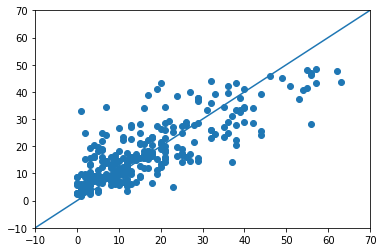

In [181]:
plt.scatter(x=y_test, y=y_pred_RFModel1)
plt.xlim([-10,70])
plt.ylim([-10,70])
plt.plot([-10,70],[-10,70])
plt.show()

## Interpreting the Random Forest Model

In [182]:
feature_import = pd.DataFrame(data=RFModel1.feature_importances_, index=X1.columns.values, columns=['values'])
feature_import.sort_values(['values'], ascending=False, inplace=True)
feature_import.transpose()


,Rumination_Total,RosenbergSES_Total,PSWQ_Total,PCI_Total,PRCScaleTotal
values,0.508902,0.254745,0.13547,0.064809,0.036074


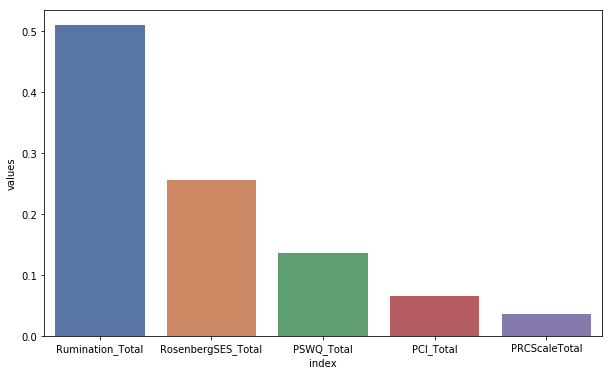

In [183]:
plt.figure(figsize=(10,6))
feature_import.reset_index(level=0, inplace=True)
sns.barplot(x='index', y='values', data=feature_import, palette='deep')
plt.show()

# XGBoost

Ref1: https://www.analyticsvidhya.com/blog/2016/03/complete-guide-parameter-tuning-xgboost-with-codes-python/

Ref2: https://www.datacamp.com/community/tutorials/xgboost-in-python

In [238]:
df_ScaledFeatures=pd.DataFrame(scaled_features, columns=df_regress.columns)
X1=df_ScaledFeatures.iloc[:,0:5] 
y1=df_regress.iloc[:,5]

In [239]:
#Convert the dataset into an optimized data structure called Dmatrix  that XGBoost supports and gives it acclaimed performance and efficiency gains.
import xgboost as xgb
data_dmatrix = xgb.DMatrix(data=X1,label=y1)

#  Fitting XGBoost And First Evaluation Of The Model

In [240]:
import xgboost as xgb

In [241]:
XGBModel = xgb.XGBRegressor(random_state=1118)
XGBModel.fit(X_train, y_train)

Scores_XGBModel = cross_val_score(estimator=XGBModel, X=X_train, y=y_train, cv=10) 

print('\n')
Scores_XGBModel .mean()
print(("Mean accuracy of model (& Std) after k-Fold CV : %.3f (%.3f)") % (Scores_XGBModel .mean(), Scores_XGBModel.std()))



Mean accuracy of model (& Std) after k-Fold CV : 0.611 (0.095)


In [242]:
#To get predictions (y_hat) and check them all in one using cross validation
#y_test is needed here in predictions to get scores for each fold of cv
Predictions_XGBModel=cross_val_predict(estimator=XGBModel, X=X_test, y=y_test, cv=10) 

Predictions_XGBModel.mean()
print(("Mean accuracy of model (& Std) after k-Fold CV : %.3f (%.3f)") % (Predictions_XGBModel.mean(), Predictions_XGBModel.std()))

Mean accuracy of model (& Std) after k-Fold CV : 17.109 (11.833)


In [243]:
#accuracy of the predictions from the best cv fold
accuracy = metrics.r2_score(y_test, Predictions_XGBModel) 
print(accuracy)

0.5658768997348976


## k-fold Cross Validation using XGBoost and new Dmatrix Object


In [244]:
#We use the belowp arameters to build a 3-fold cross validation model by invoking XGBoost's cv() method and store the results in a cv_results DataFrame. 
Parameters_XGBModel = {"objective":"reg:linear",'colsample_bytree': 0.3,'learning_rate': 0.1,
                'max_depth': 5, 'alpha': 10}

cv_results = xgb.cv(dtrain=data_dmatrix, params=Parameters_XGBModel, nfold=10,
                    num_boost_round=50,early_stopping_rounds=10,metrics="rmse", as_pandas=True, seed=1118)

In [245]:
#cv_results contains train and test RMSE metrics for each boosting round.
cv_results.head()

,train-rmse-mean,train-rmse-std,test-rmse-mean,test-rmse-std
0,19.798466,0.107102,19.787016,1.003033
1,18.372159,0.159212,18.384380,0.953462
2,17.063624,0.166596,17.094791,0.907315
3,15.972998,0.189198,16.021779,0.892485
4,14.942043,0.174919,14.993271,0.894461


In [246]:
#Extract and print the final boosting round metric.
print((cv_results["test-rmse-mean"]).tail(1))

49    8.254986
Name: test-rmse-mean, dtype: float64


In [247]:
xg_reg = xgb.train(params=Parameters_XGBModel, dtrain=data_dmatrix, num_boost_round=10)

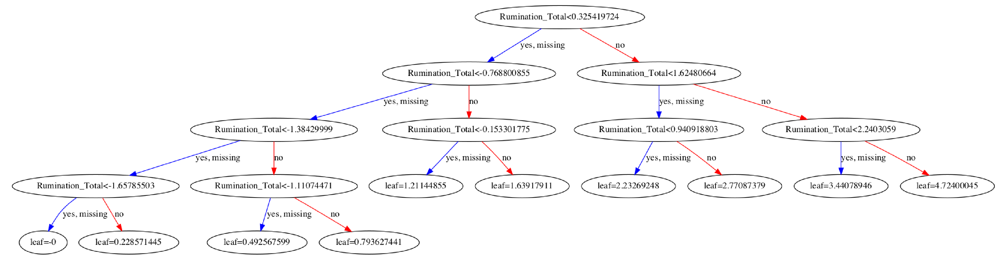

In [250]:
# This plot provides insight into how the model arrived at its final decisions and what splits it made to arrive at those decisions.

import matplotlib.pyplot as plt

xgb.plot_tree(xg_reg,num_trees=0)
plt.rcParams['figure.figsize'] = [70, 40]
plt.show()

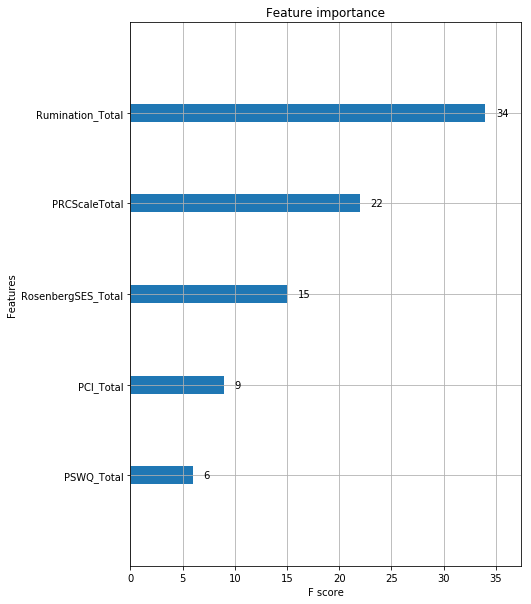

In [252]:
#This plot shows the number of times each feature is split on across all boosting rounds (trees) in the model, and then visualizing the result as a bar graph, with the features ordered according to how many times they appear.
#This is another way to do feature selection
xgb.plot_importance(xg_reg)
plt.rcParams['figure.figsize'] = [6,10]
plt.show()

## Hyperparameter Tuning - XGBoost Model

In [201]:
XGBModel = xgb.XGBRegressor(random_state=1118)

# Parameters_XGBModel ={
#         'min_child_weight': [1, 5, 10],
#         'gamma': [0.5, 1, 1.5, 2, 5],
#         'subsample': [0.6, 0.8, 1.0],
#         'colsample_bytree': [0.6, 0.8, 1.0],
#         'max_depth': [3, 4, 5]
#         }


grid_search = GridSearchCV(estimator = XGBModel,
                           param_grid = Parameters_XGBModel,
                           cv = 10,
                           n_jobs = -1)

grid_search = grid_search.fit(X_train, y_train)
best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_
best_estimator = grid_search.best_estimator_

print("Best accuracy: %.3f "%best_accuracy)
print("-----------------------------")
print("Best parameters are:",best_parameters)
print("-----------------------------")
print("Best estimators are:",best_estimator)


ValueError: Parameter values for parameter (objective) need to be a sequence(but not a string) or np.ndarray.

In [ ]:
#Hyperparameter Tuning Part 2:
XGBModel = xgb.XGBRegressor(random_state=1118)

Parameters_XGBModel ={'learning_rate':[0.1,0.3],
 'n_estimators':[500],
 'max_depth':[1,3,5],
 'min_child_weight':[4,5,6],
 'gamma':[0.1,1],
 'subsample':[0.8],
 'colsample_bytree':[0.5,0.8,1.0],
 'nthread':[4],
 'scale_pos_weight':[1],
 'seed':[1118]}


grid_search = GridSearchCV(estimator = XGBModel,
                           param_grid = Parameters_XGBModel,
                           cv = 5,
                           n_jobs = -1)

grid_search = grid_search.fit(X_train, y_train)
best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_
best_estimator = grid_search.best_estimator_

print("Best accuracy: %.3f "%best_accuracy)
print("-----------------------------")
print("Best parameters are:",best_parameters)
print("-----------------------------")
print("Best estimators are:",best_estimator)


## Retrain XGBoost Model Using Parameters from Grid Search

In [492]:
# XGBModel1 = xgb.XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
#        colsample_bytree=0.8, gamma=0.1, importance_type='gain',
#        learning_rate=0.04, max_delta_step=0, max_depth=1,
#        min_child_weight=5, missing=None, n_estimators=300, n_jobs=1,
#        nthread=4, objective='reg:linear', random_state=1118, reg_alpha=0,
#        reg_lambda=1, scale_pos_weight=1, seed=1118, silent=True,
#        subsample=0.7)



XGBModel1 = xgb.XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0.1, importance_type='gain',
       learning_rate=0.04, max_delta_step=0, max_depth=1,
       min_child_weight=5, missing=None, n_estimators=300, n_jobs=1,
       nthread=4, objective='reg:linear', random_state=1118, reg_alpha=0.1,
       reg_lambda=1, scale_pos_weight=1, seed=1118, silent=True,
       subsample=0.7)





XGBModel1.fit(X_train, y_train)

y_pred_XGBModel1 = XGBModel1.predict(X_test)

## Predictions from the XGBoost Model

In [493]:
#Score to see how good a fit the model is
XGBModel1.score(X_test,y_test)

0.6580166473148025

In [307]:
y_pred_XGBModel1 = XGBModel1.predict(X_test)

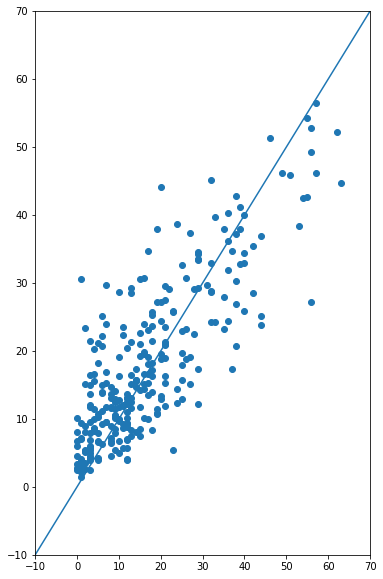

In [308]:
#Scatterplot comparing y_test with predictions - if output is lined up like this ==> pretty good job
plt.scatter(y_test,y_pred_XGBModel1)
plt.xlim([-10,70])
plt.ylim([-10,70])
plt.plot([-10,70],[-10,70])
plt.show()

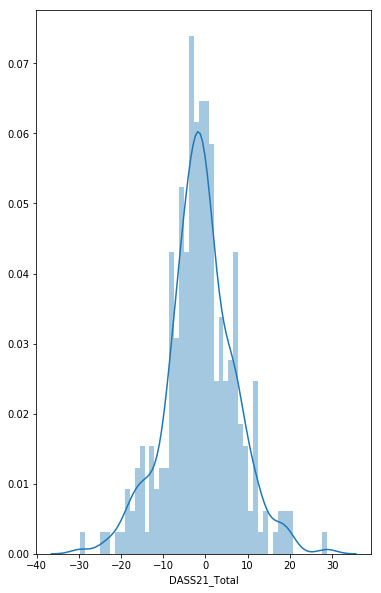

In [309]:
#Create histogram of the distribution of our residuals
#If we have a normal distribution for the residuals, it means our model was a correct choice for the data.
sns.distplot((y_test-y_pred_XGBModel1),bins=50);

## XGBoost Evaluation Metrics

In [310]:
print('Mean Absolute Error:%.2f ' %  metrics.mean_absolute_error(y_test, y_pred_XGBModel1))
print('Mean Squared Error:%.2f ' %  metrics.mean_squared_error(y_test, y_pred_XGBModel1))
print('Root Mean Squared Error:%.2f ' %  np.sqrt(metrics.mean_squared_error(y_test, y_pred_XGBModel1)))
print('\n')
# Explained variance score: 1 is perfect prediction
#R^2 (coefficient of determination) regression score function.
print('Variance score: %.2f' % metrics.r2_score(y_test, y_pred_XGBModel1))

print('Explained variance regression score:%.2f' %  metrics.explained_variance_score(y_test, y_pred_XGBModel1))

Mean Absolute Error:6.17 
Mean Squared Error:67.86 
Root Mean Squared Error:8.24 


Variance score: 0.66
Explained variance regression score:0.67


# Summary of Accuracies for Each Model:

Ref: https://stackoverflow.com/questions/45627784/unable-to-obtain-accuracy-score-for-my-linear


In [311]:
LRModel.fit(X_train, y_train)
Accuracy_LRModel = LRModel.score(X_test, y_test)
print ("Accuracy score of Linear Regression Model:", round(Accuracy_LRModel*100,2),'%')
print('\n')
# RRModel1

RRModel1.fit(X_train, y_train)
Accuracy_RRModel1 = RRModel1.score(X_test, y_test)
print ("Accuracy score of Ridge Regression Model:", round(Accuracy_RRModel1*100,2),'%')
print('\n')

# LModel1
LModel1.fit(X_train, y_train)
Accuracy_LModel1 = LModel1.score(X_test, y_test)
print ("Accuracy score of Lasso Regression Model:", round(Accuracy_LModel1*100,2),'%')
print('\n')

# ENModel1

ENModel1.fit(X_train, y_train)
Accuracy_ENModel1 = ENModel1.score(X_test, y_test)
print ("Accuracy score of Elastic Net Regression Model:", round(Accuracy_ENModel1*100,2),'%')
print('\n')

#RFModel1
RFModel1.fit(X_train, y_train)
Accuracy_RFModel1 = RFModel1.score(X_test, y_test)
print ("Accuracy score of Random Forest Regression Model:", round(Accuracy_RFModel1*100,2),'%')
print('\n')

#XGBModel1
RFModel1.fit(X_train, y_train)
Accuracy_XGBModel1 = XGBModel1.score(X_test, y_test)
print ("Accuracy score of XGBoost Model:", round(Accuracy_XGBModel1*100,2),'%')
print('\n')


Accuracy score of Linear Regression Model: 63.78 %


Accuracy score of Ridge Regression Model: 63.76 %


Accuracy score of Lasso Regression Model: 63.78 %


Accuracy score of Elastic Net Regression Model: -75.75 %


Accuracy score of Random Forest Regression Model: 63.27 %


Accuracy score of XGBoost Model: 65.8 %




In [312]:
baseline=np.mean(y1)
print(baseline)

17.34162162162162
